# Mouse retina neuron development
# Least action path--action along path(transition state)--gene kinetics heatmap 

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import anndata
import dynamo as dyn
dyn.get_all_dependencies_version()

2023-12-04 12:57:35.246869: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-04 12:57:36.519788: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


package,tqdm,statsmodels,setuptools,scipy,scikit-learn,pandas,numpy,networkx,matplotlib,anndata,igraph,loompy,numdifftools,umap-learn,numba,seaborn,colorcet,pynndescent,pre-commit,get-version,openpyxl,typing-extensions,session-info,dynamo-release
version,4.65.0,0.14.0,68.0.0,1.10.0,1.2.2,1.5.3,1.22.3,2.8.4,3.7.1,0.9.1,0.10.4,3.0.7,0.9.41,0.5.3,0.56.4,0.12.2,3.0.1,0.5.8,3.2.0,3.5.4,3.2.0b1,4.5.0,1.0.0,1.3.3


## Load data

In [2]:
adata = anndata.read("mouse_retina.h5ad")

## Preprocess the Data

In [3]:
dyn.pp.recipe_monocle(adata)

|-----? dynamo.preprocessing.deprecated is deprecated.
|-----> recipe_monocle_keep_filtered_cells_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_cells_key=True
|-----> recipe_monocle_keep_filtered_genes_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_filtered_genes_key=True
|-----> recipe_monocle_keep_raw_layers_key is None. Using default value from DynamoAdataConfig: recipe_monocle_keep_raw_layers_key=True
|-----> apply Monocole recipe to adata...
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----> filtering cells...
|-----> 2683 cells passed basic filters.
|-----> filtering gene...
|-----> 4836 genes passed basic filters.
|-----> calculating size factor...
|-----> selecting genes in layer: X, sort method: SVR...
|-----> size factor normalizing the data, followed by log1p transformation.

## Kinetic estimation

In [4]:
dyn.tl.dynamics(adata, model='stochastic', cores=100)

|-----> dynamics_del_2nd_moments_key is None. Using default value from DynamoAdataConfig: dynamics_del_2nd_moments_key=False
|-----------> removing existing M layers:[]...
|-----------> making adata smooth...
|-----> calculating first/second moments...
|-----> [moments calculation] completed [13.5491s]


AnnData object with n_obs × n_vars = 2726 × 31053
    obs: 'Clusters', 'Annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'log_m', 'score', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics'
    uns: 'paper_review_url', 'paper_url', 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics'
    obsm: 'X_umap', 'X_pca', 'X', 'cell_cycle_scores'
    layers: 'spliced', 'unspliced', 'X_spliced', 'X_unspliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con'

In [5]:
dyn.tl.reduceDimension(adata)

|-----> retrieve data for non-linear dimension reduction...
|-----? adata already have basis umap. dimension reduction umap will be skipped! 
set enforce=True to re-performing dimension reduction.
|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:pca
|-----> method arg is None, choosing methods automatically...
|-----------> method ball_tree selected
|-----> [UMAP] completed [0.1977s]


## RNA velocity calculating

In [6]:
dyn.tl.cell_velocities(adata, method='cosine')
dyn.tl.cell_velocities(adata, basis='pca', method="cosine")

|-----> [calculating transition matrix via cosine kernel with sqrt transform.] in progress: 100.0000%|-----> [calculating transition matrix via cosine kernel with sqrt transform.] completed [1.3705s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%|-----> [projecting velocity vector to low dimensional embedding] completed [0.5956s]
Using existing cosine_transition_matrix found in .obsp.
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%|-----> [projecting velocity vector to low dimensional embedding] completed [0.6637s]


AnnData object with n_obs × n_vars = 2726 × 31053
    obs: 'Clusters', 'Annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'log_m', 'score', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'paper_review_url', 'paper_url', 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'grid_velocity_umap', 'grid_velocity_pca'
    obsm: 'X_umap', 'X_pca', 'X', 'cell_cycle_scores', 'velocity_umap', 'velocity_pca'
    layers: 'spliced', 'unspliced', 'X_spliced', '

## Reconstruct vector field

In [10]:
dyn.vf.VectorField(adata, basis='pca')
dyn.vf.VectorField(adata, basis='umap')

|-----> VectorField reconstruction begins...
|-----> Retrieve X and V based on basis: PCA. 
        Vector field will be learned in the PCA space.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] completed [0.1673s]
|-----> [VectorField] completed [0.2956s]
|-----> VectorField reconstruction begins...
|-----> Retrieve X and V based on basis: UMAP. 
        Vector field will be learned in the UMAP space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.
|-----> [SparseVFC] begins...
|-----> Sampling control points based on data velocity magnitude...
|-----> [SparseVFC] completed [0.2691s]
|-----> [VectorField] completed [0.3931s]


## Characterize vector field topology

In [8]:
dyn.vf.topography(adata, n=100, basis='umap')

AnnData object with n_obs × n_vars = 2726 × 31053
    obs: 'Clusters', 'Annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'log_m', 'score', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'paper_review_url', 'paper_url', 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'grid_velocity_umap', 'grid_velocity_pca', 'VecFld_pca',

|-----> Vector field for umap is but its topography is not mapped. Mapping topography now ...
|-----------> plotting with basis key=X_umap
|-----------> skip filtering Annotation by stack threshold when stacking color because it is not a numeric type


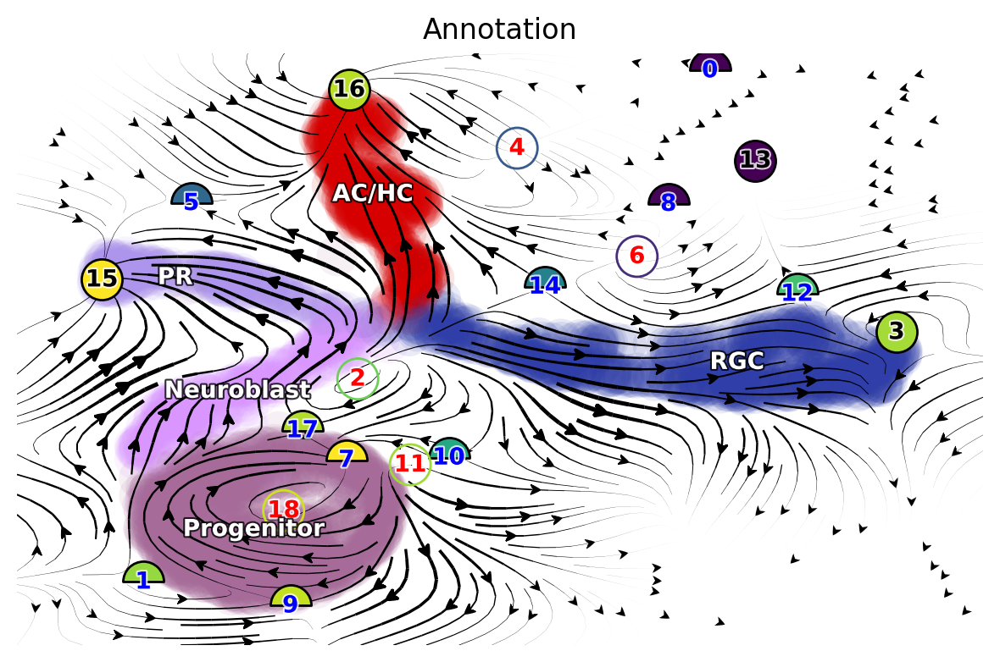

In [11]:
dyn.pl.topography(
    adata,
    color="Annotation",
    markersize=300,
    basis="umap",
    fps_basis="umap",
    streamline_alpha=1.0,
)

In [12]:
Xss, ftype = adata.uns['VecFld_umap']['Xss'], adata.uns['VecFld_umap']['ftype']
good_fixed_points = [18, 15, 16, 3]
adata.uns['VecFld_umap']['Xss'] = Xss[good_fixed_points]
adata.uns['VecFld_umap']['ftype'] = ftype[good_fixed_points]

|-----------> plotting with basis key=X_umap
|-----------> skip filtering Annotation by stack threshold when stacking color because it is not a numeric type


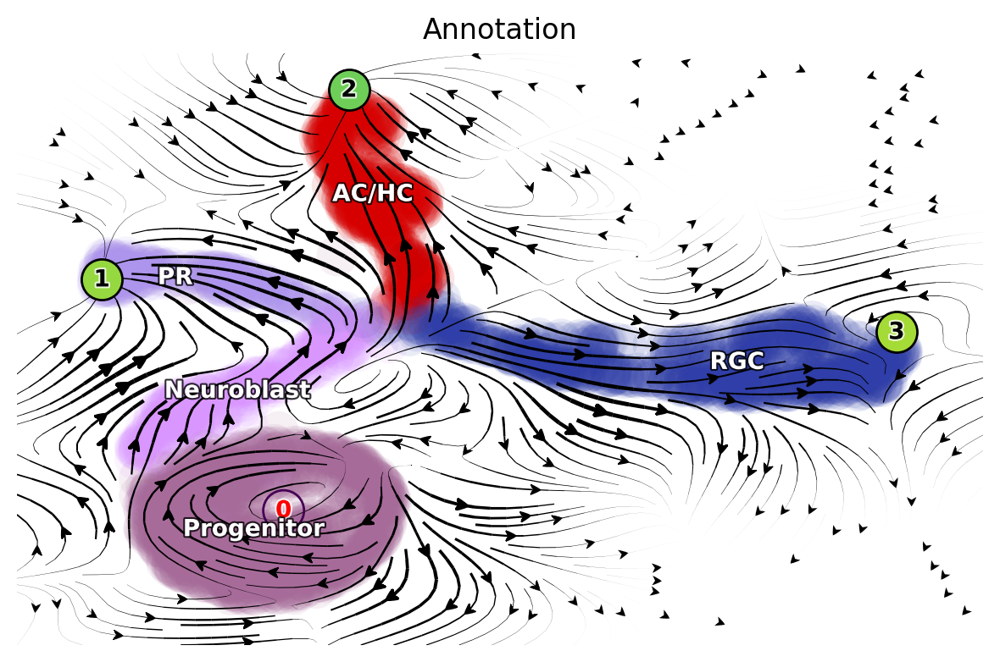

In [13]:
dyn.pl.topography(
    adata,
    color="Annotation",
    markersize=300,
    basis="umap",
    fps_basis="umap",
    streamline_alpha=1.0,
)

## Least action path predictions

In [15]:
Progenitor_cells = dyn.tl.select_cell(adata, "Annotation", "Progenitor")
PR_cells = dyn.tl.select_cell(adata, "Annotation", "PR")
AC_HC_cells = dyn.tl.select_cell(adata, "Annotation", "AC/HC")
RGC_cells = dyn.tl.select_cell(adata, "Annotation", "RGC")

In [16]:
adata.uns['VecFld_umap']['Xss']

array([[-1.97317774, -4.97152945],
       [-6.0133952 ,  4.87589971],
       [-0.51974371, 12.96599155],
       [11.6494818 ,  2.63757204]])

In [14]:
from dynamo.tools.utils import nearest_neighbors

fixed_points = np.array(
    [
        [-1.97317774, -4.97152945],
        [-6.0133952 ,  4.87589971],
        [-0.51974371, 12.96599155],
        [11.6494818 ,  2.63757204],
    ]
)

Progenitor_cells_indices = nearest_neighbors(fixed_points[0], adata.obsm["X_umap"])
PR_cells_indices = nearest_neighbors(fixed_points[1], adata.obsm["X_umap"])
AC_HC_cells_indices = nearest_neighbors(fixed_points[2], adata.obsm["X_umap"])
RGC_cells_indices = nearest_neighbors(fixed_points[3], adata.obsm["X_umap"])

### Compute neighbor graph based on umap

In [17]:
dyn.tl.neighbors(adata, basis="umap", result_prefix="umap")

|-----> Start computing neighbor graph...
|-----------> X_data is None, fetching or recomputing...
|-----> fetching X data from layer:None, basis:umap
|-----> method arg is None, choosing methods automatically...
|-----------> method kd_tree selected


AnnData object with n_obs × n_vars = 2726 × 31053
    obs: 'Clusters', 'Annotation', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'ntr', 'cell_cycle_phase', 'control_point_pca', 'inlier_prob_pca', 'obs_vf_angle_pca', 'control_point_umap', 'inlier_prob_umap', 'obs_vf_angle_umap'
    var: 'nCells', 'nCounts', 'pass_basic_filter', 'log_cv', 'log_m', 'score', 'frac', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'bs', 'bf', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'paper_review_url', 'paper_url', 'pp', 'velocyto_SVR', 'PCs', 'explained_variance_ratio_', 'pca_mean', 'pca_fit', 'feature_selection', 'cell_phase_genes', 'dynamics', 'neighbors', 'grid_velocity_umap', 'grid_velocity_pca', 'VecFld_pca',

### Run pairwise least action path analyses among four distinct cell types

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.018330
|-----> [iterating through 1 pairs] completed [6.1267s]
|-----> [least action path] completed [6.1287s]


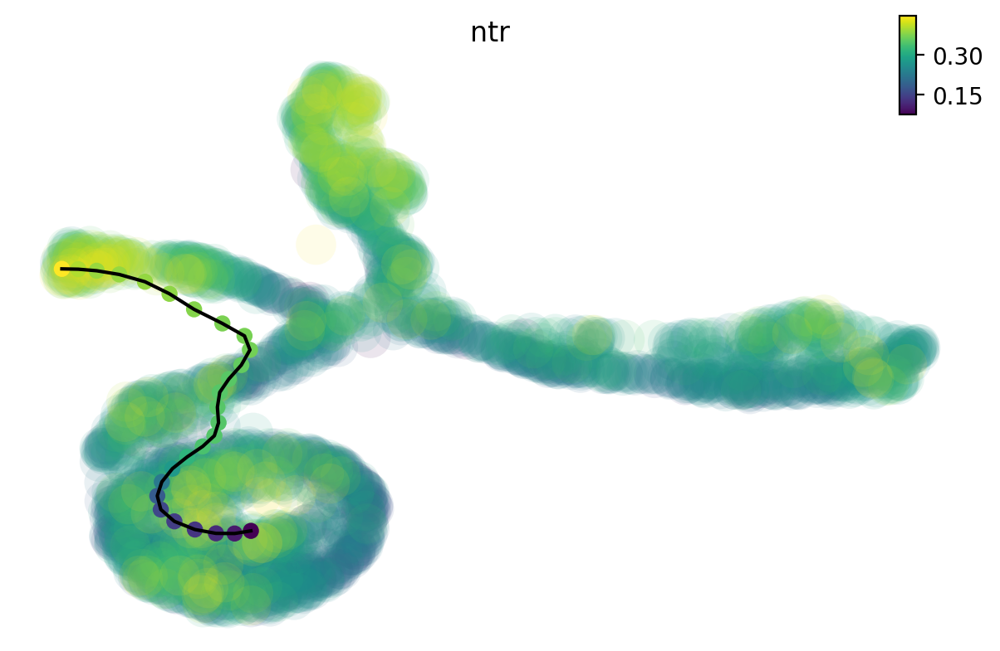

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.036261
|-----> [iterating through 1 pairs] completed [148.9706s]
|-----> [least action path] completed [148.9731s]
[[ 680 2587 1519  395  397]] -> [[ 337   56 1163 2329 1080]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.021343
|-----> [iterating through 1 pairs] completed [7.3112s]
|-----> [least action path] completed [7.3129s]


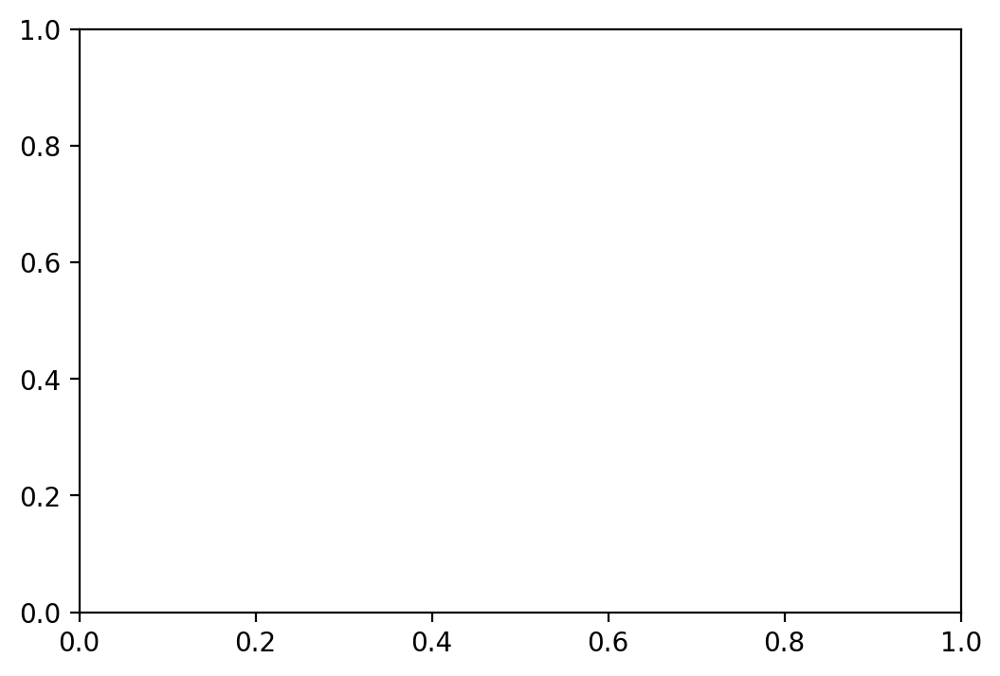

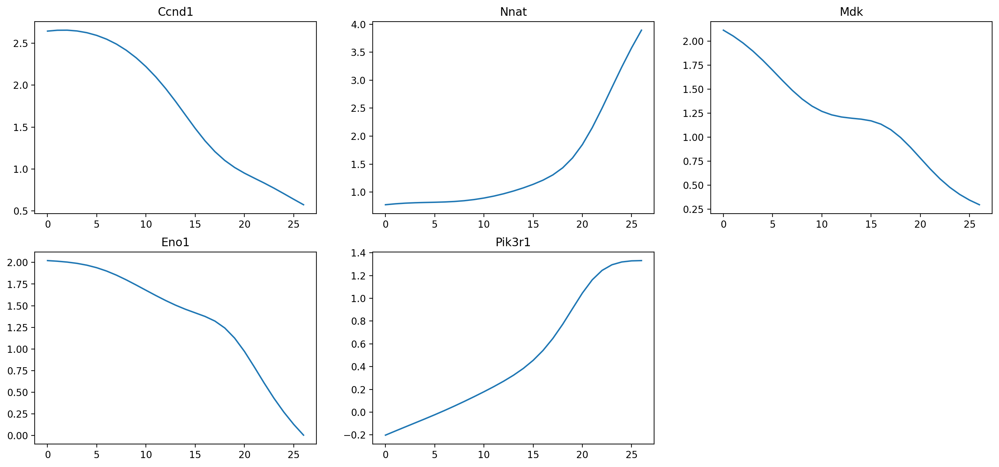

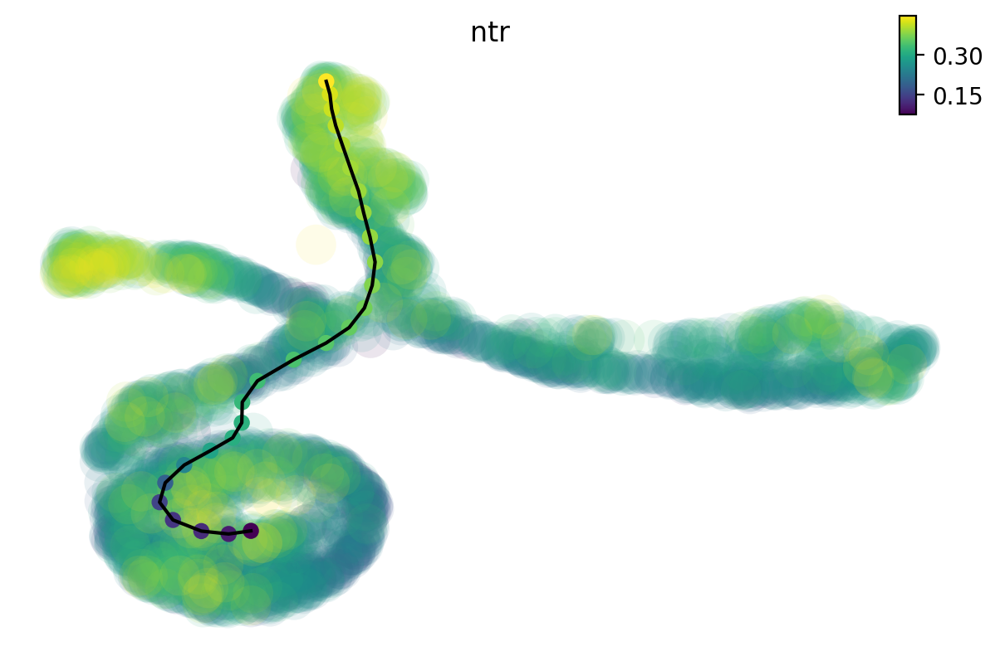

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.028734
|-----> [iterating through 1 pairs] completed [276.6090s]
|-----> [least action path] completed [276.6132s]
[[ 680 2587 1519  395  397]] -> [[ 234 1468  740 1278 2295]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.027842
|-----> [iterating through 1 pairs] completed [7.8669s]
|-----> [least action path] completed [7.8685s]


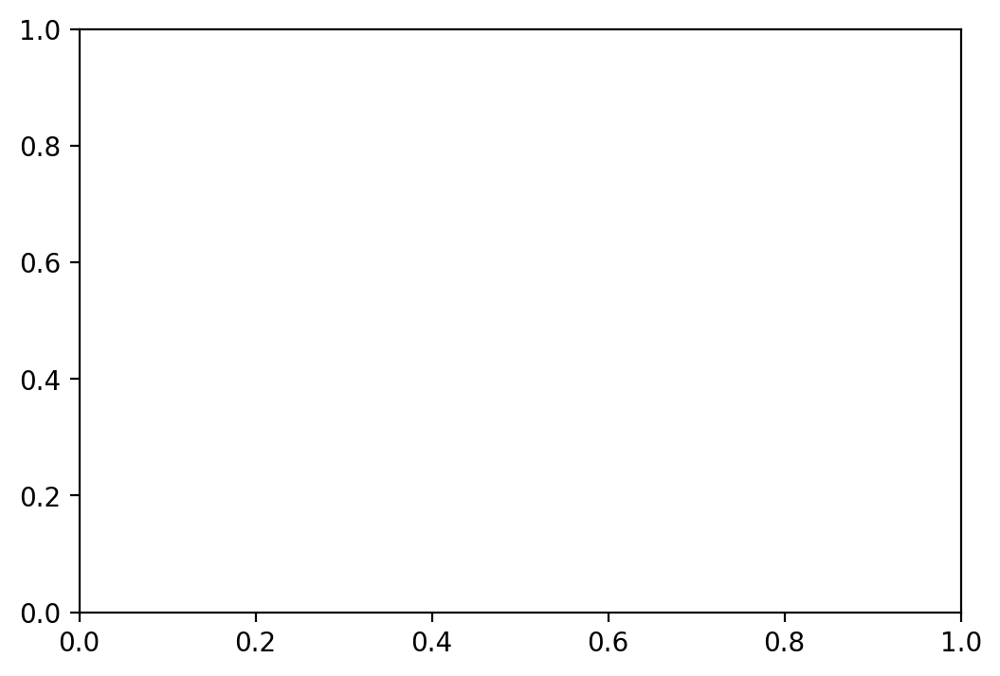

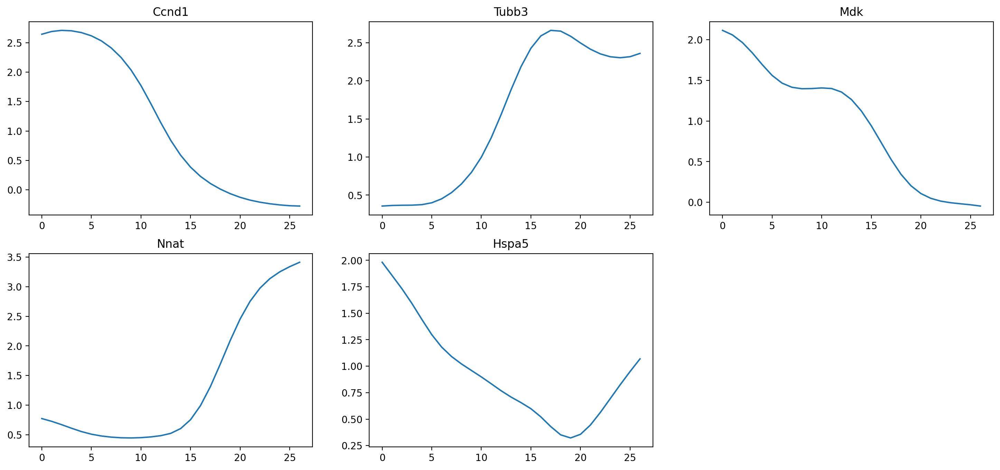

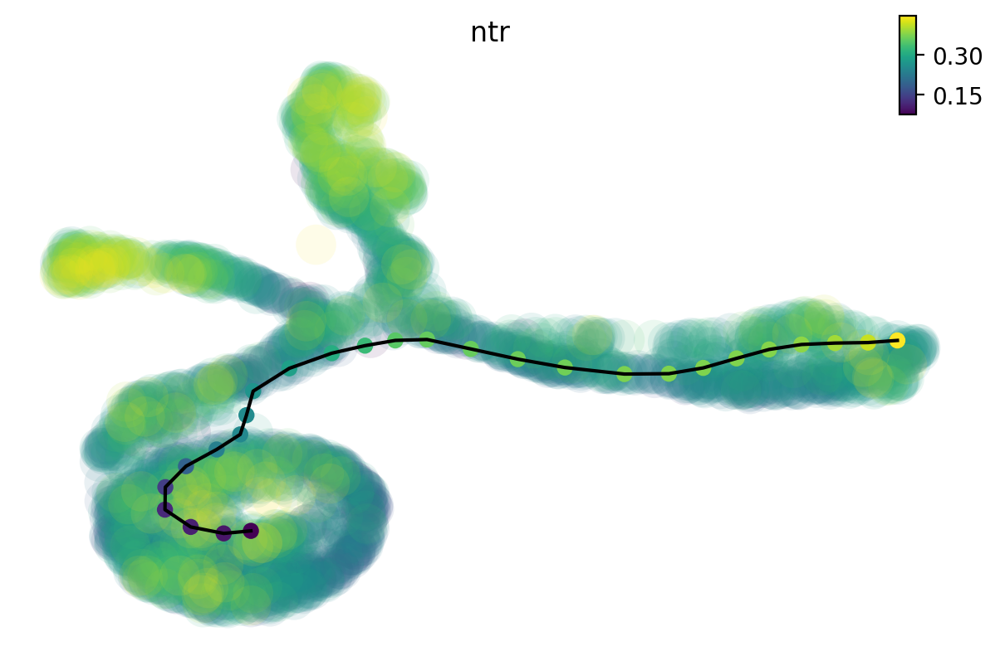

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.020429
|-----> [iterating through 1 pairs] completed [197.1998s]
|-----> [least action path] completed [197.2018s]
[[ 680 2587 1519  395  397]] -> [[ 801 1246 1342 1835  155]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.314228
|-----> [iterating through 1 pairs] completed [0.7604s]
|-----> [least action path] completed [0.7615s]


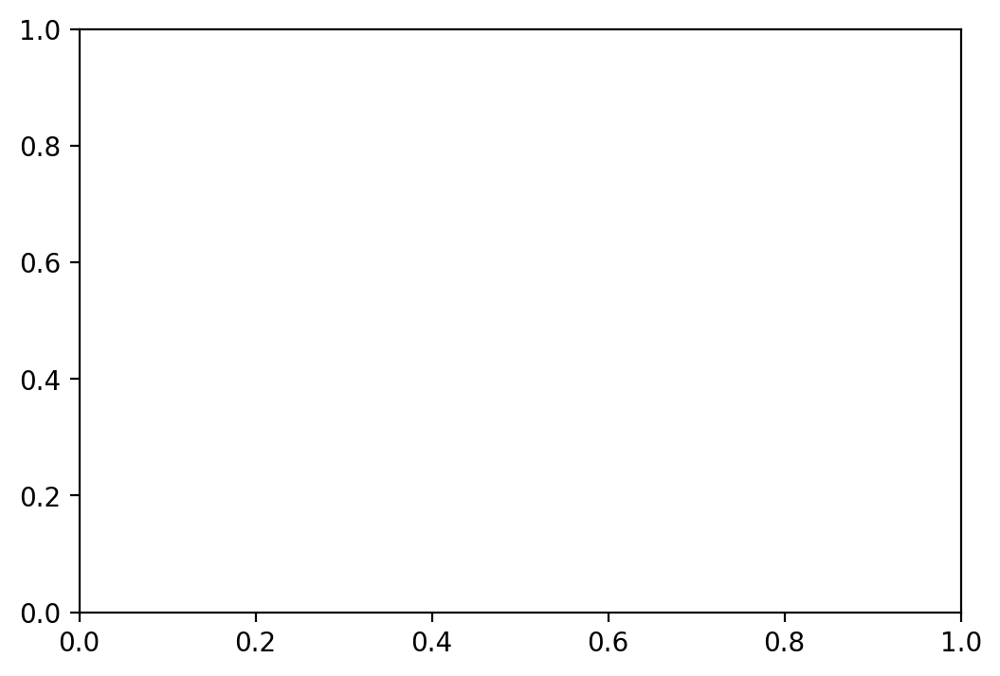

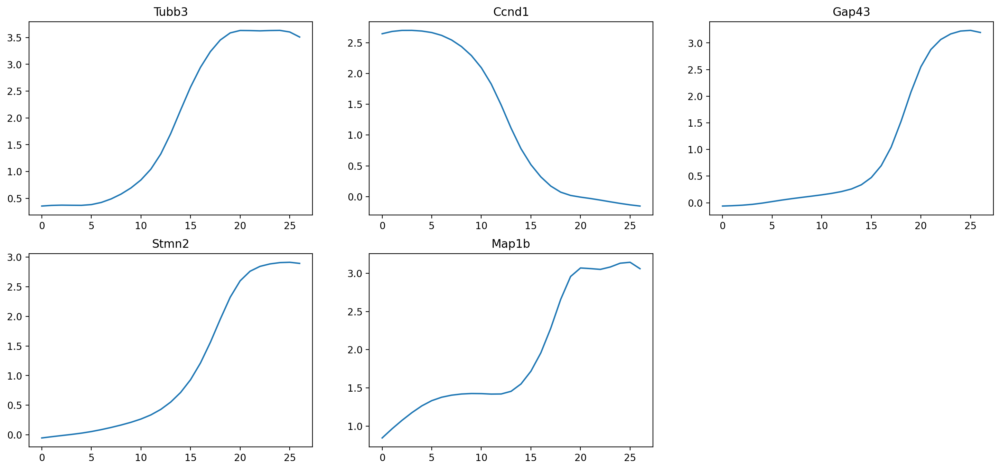

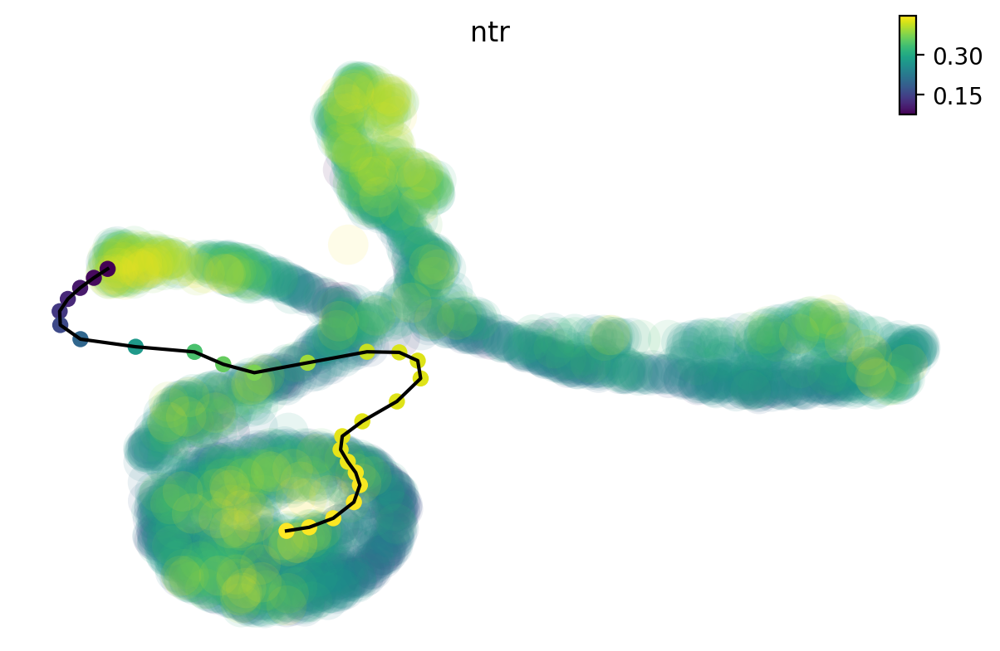

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.084275
|-----> [iterating through 1 pairs] completed [25.1905s]
|-----> [least action path] completed [25.1917s]
[[ 337   56 1163 2329 1080]] -> [[ 680 2587 1519  395  397]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.279096
|-----> [iterating through 1 pairs] completed [0.7152s]
|-----> [least action path] completed [0.7162s]


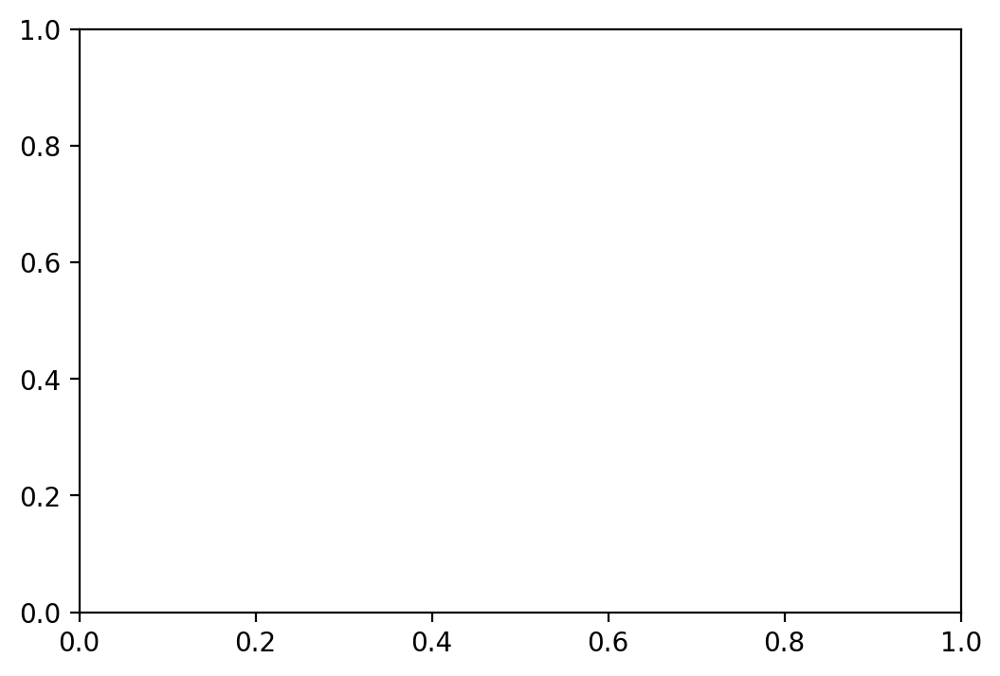

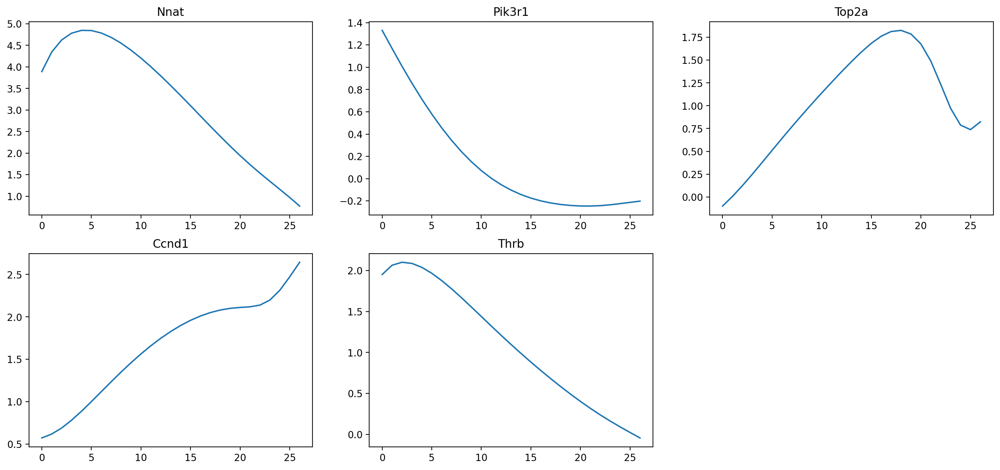

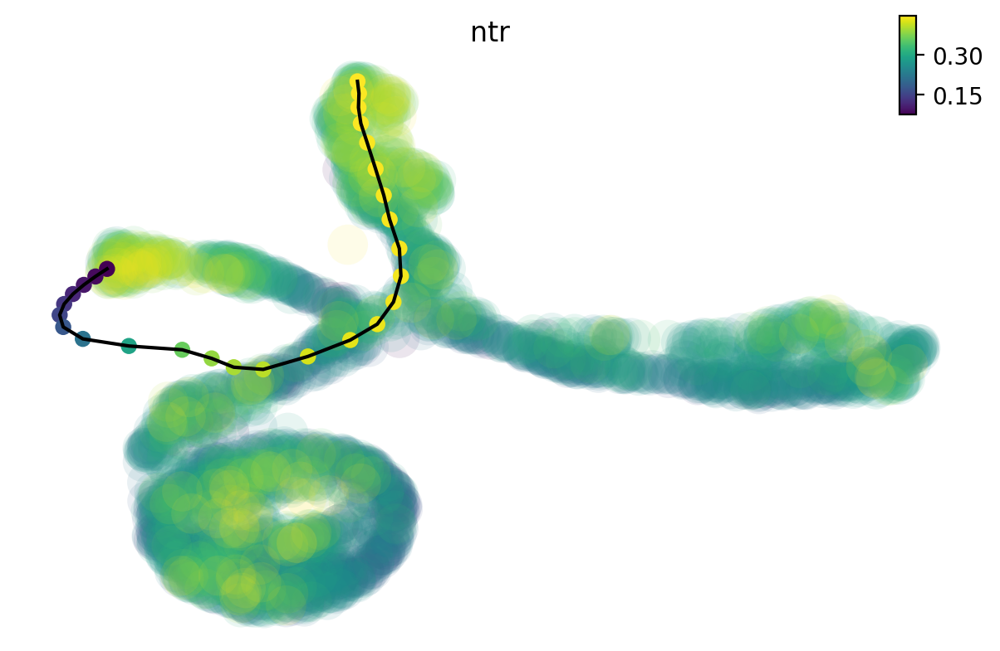

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.065863
|-----> [iterating through 1 pairs] completed [29.5295s]
|-----> [least action path] completed [29.5307s]
[[ 337   56 1163 2329 1080]] -> [[ 234 1468  740 1278 2295]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.253052
|-----> [iterating through 1 pairs] completed [1.0486s]
|-----> [least action path] completed [1.0497s]


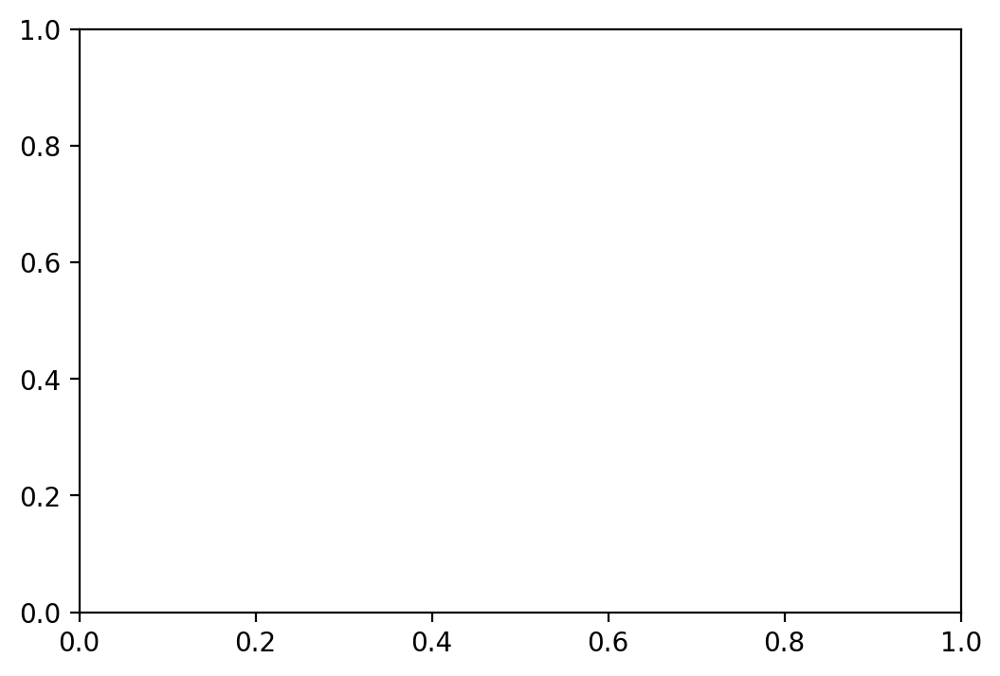

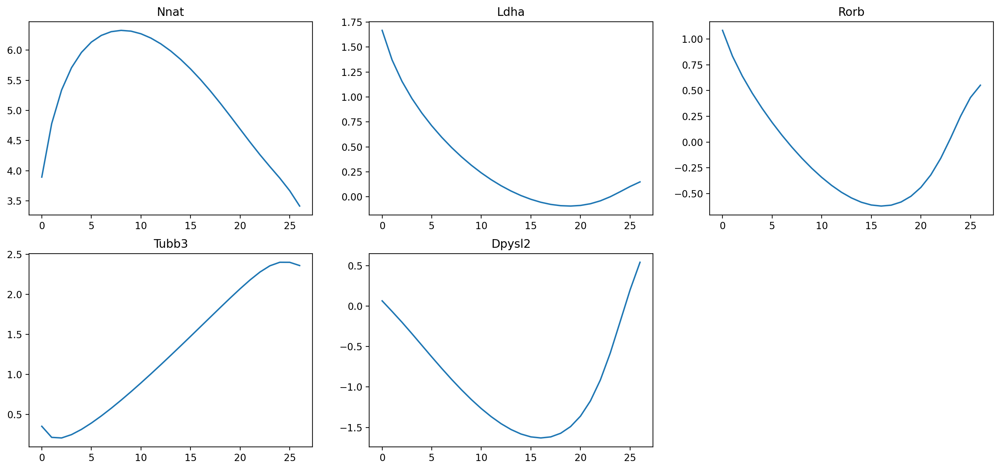

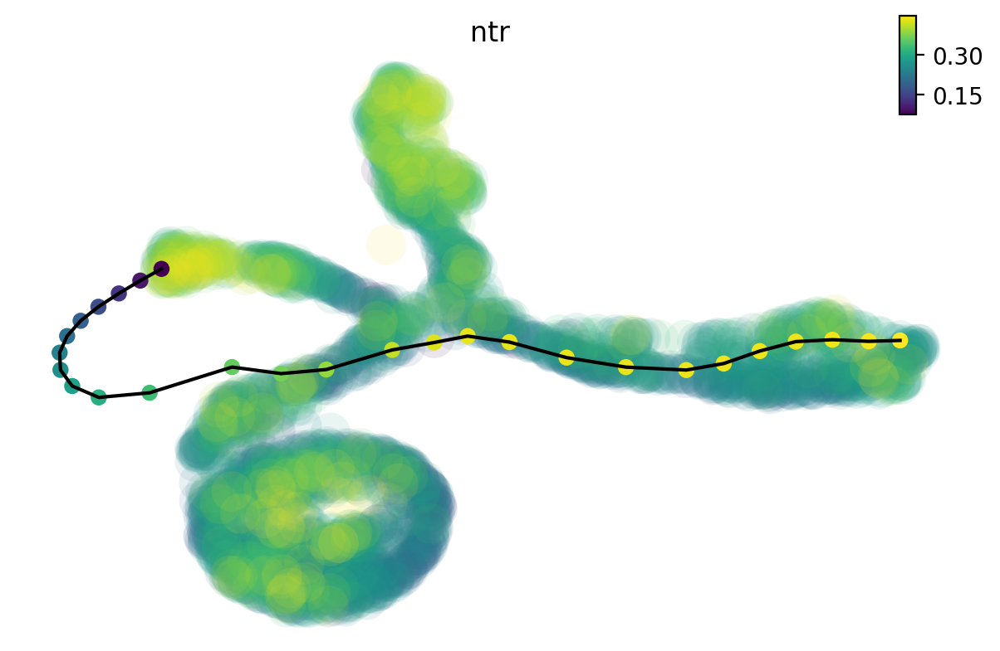

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.066154
|-----> [iterating through 1 pairs] completed [22.1150s]
|-----> [least action path] completed [22.1161s]
[[ 337   56 1163 2329 1080]] -> [[ 801 1246 1342 1835  155]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 1.021310
|-----> [iterating through 1 pairs] completed [0.6333s]
|-----> [least action path] completed [0.6345s]


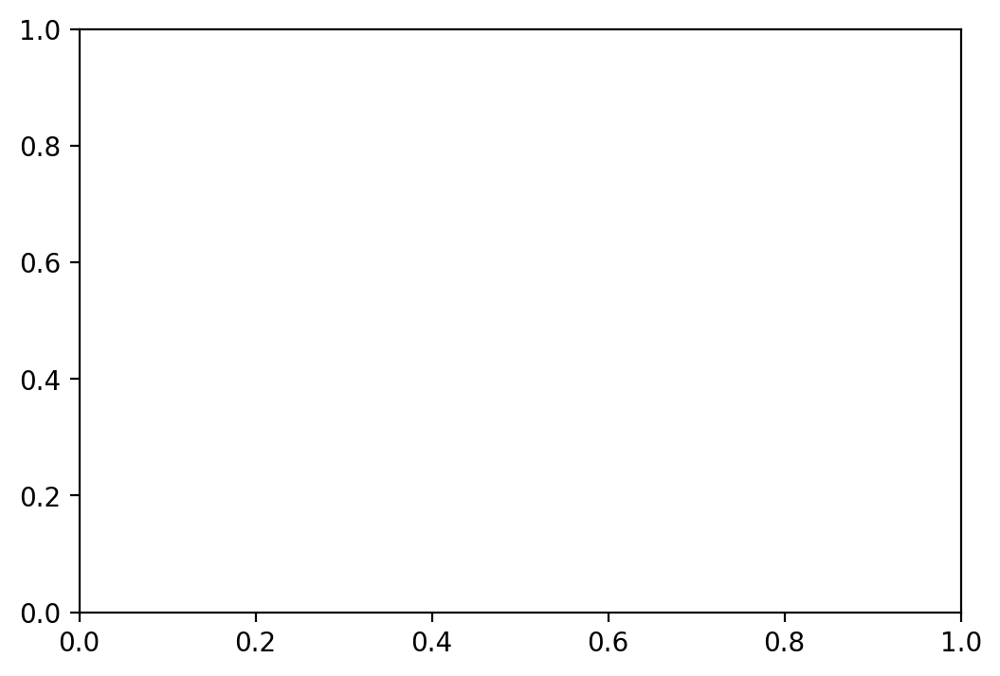

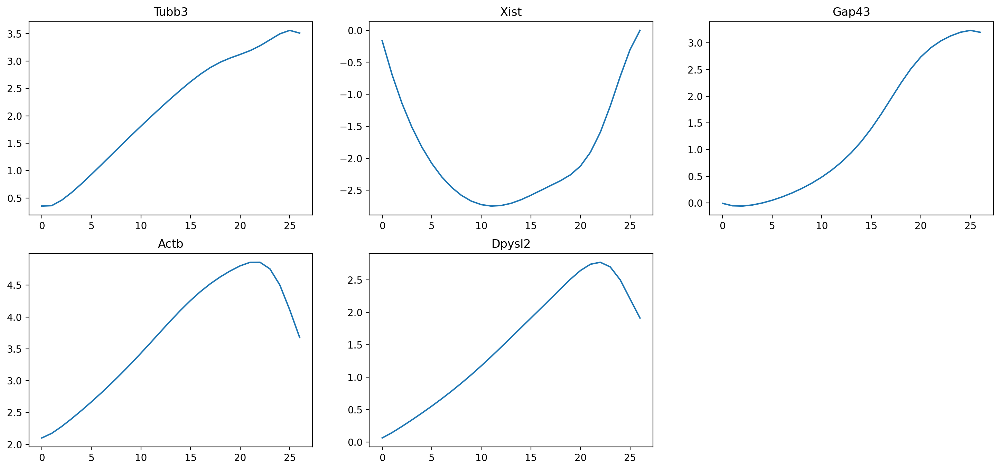

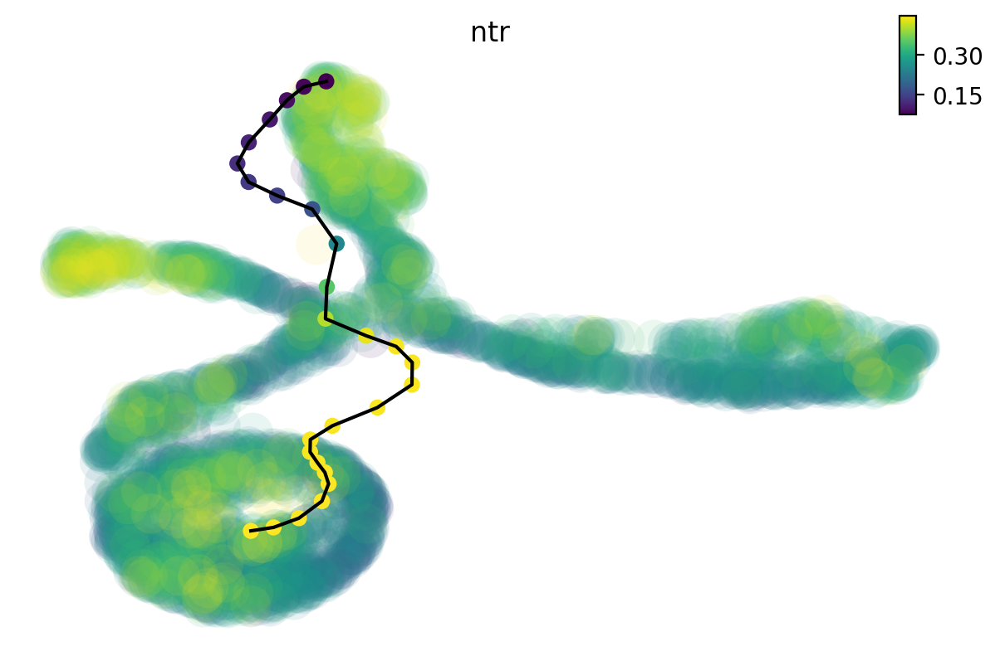

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.044003
|-----> [iterating through 1 pairs] completed [25.7669s]
|-----> [least action path] completed [25.7681s]
[[ 234 1468  740 1278 2295]] -> [[ 680 2587 1519  395  397]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.206037
|-----> [iterating through 1 pairs] completed [0.6552s]
|-----> [least action path] completed [0.6563s]


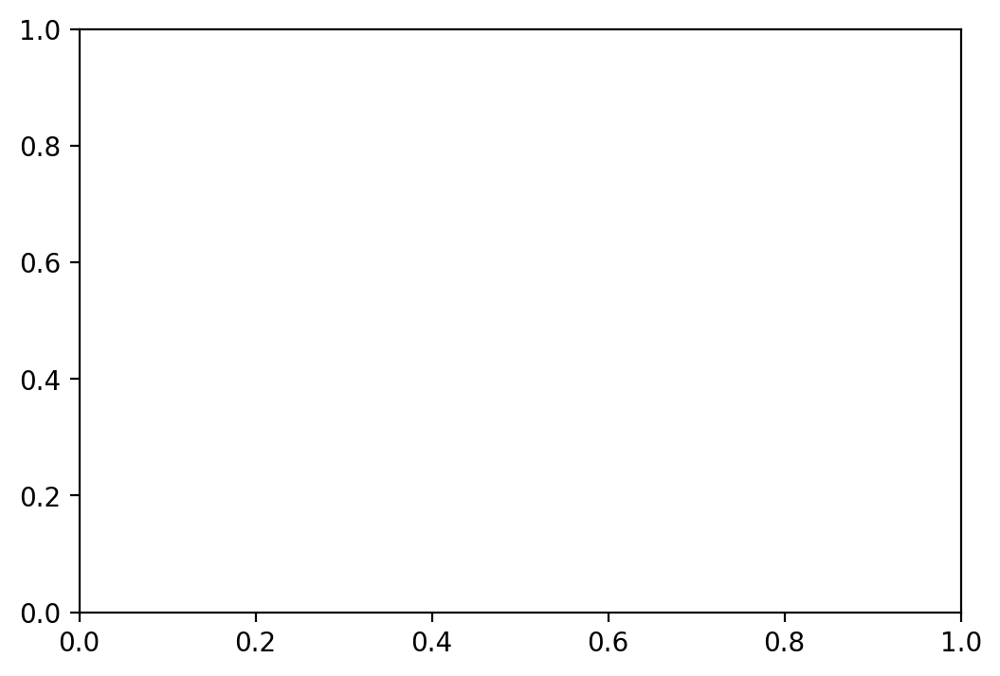

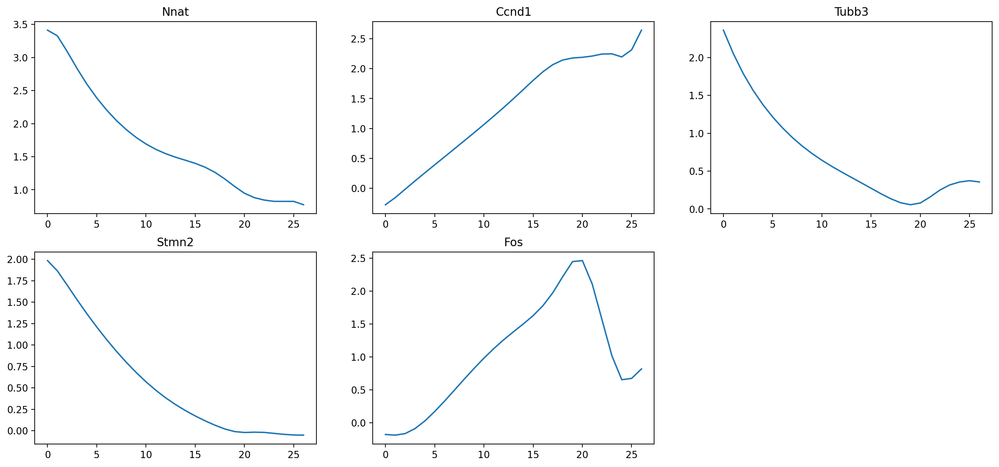

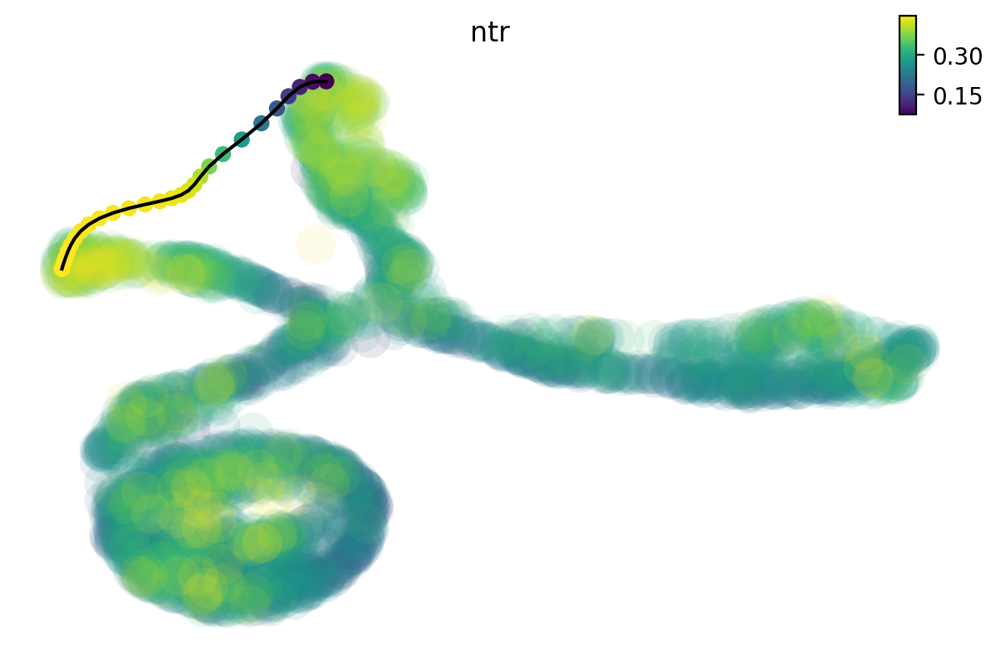

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.065376
|-----> [iterating through 1 pairs] completed [29.0049s]
|-----> [least action path] completed [29.0062s]
[[ 234 1468  740 1278 2295]] -> [[ 337   56 1163 2329 1080]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.135130
|-----> [iterating through 1 pairs] completed [0.8390s]
|-----> [least action path] completed [0.8399s]


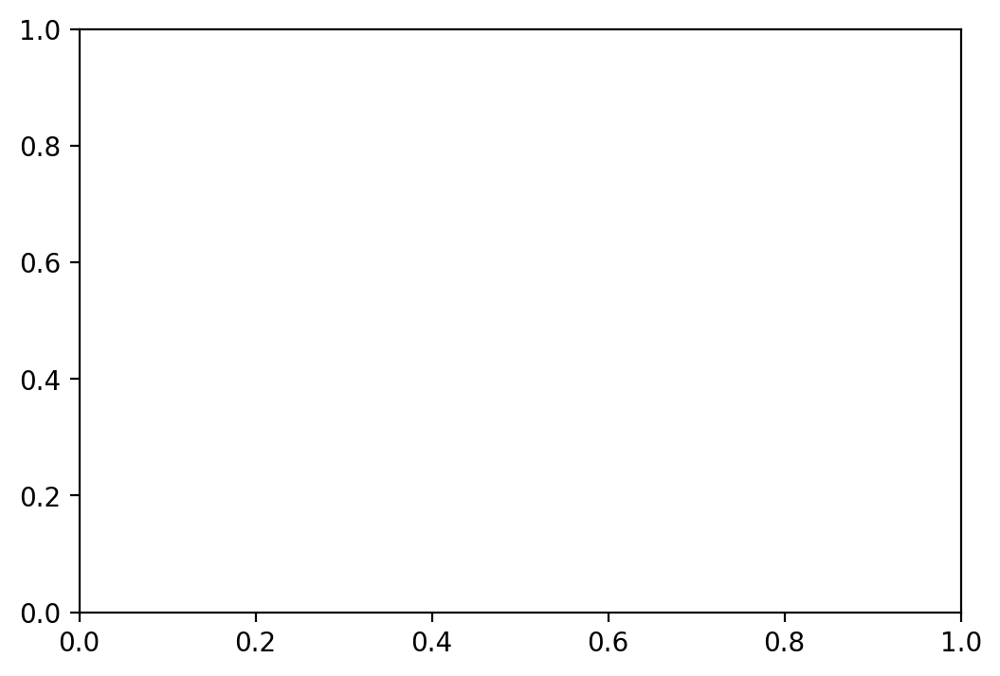

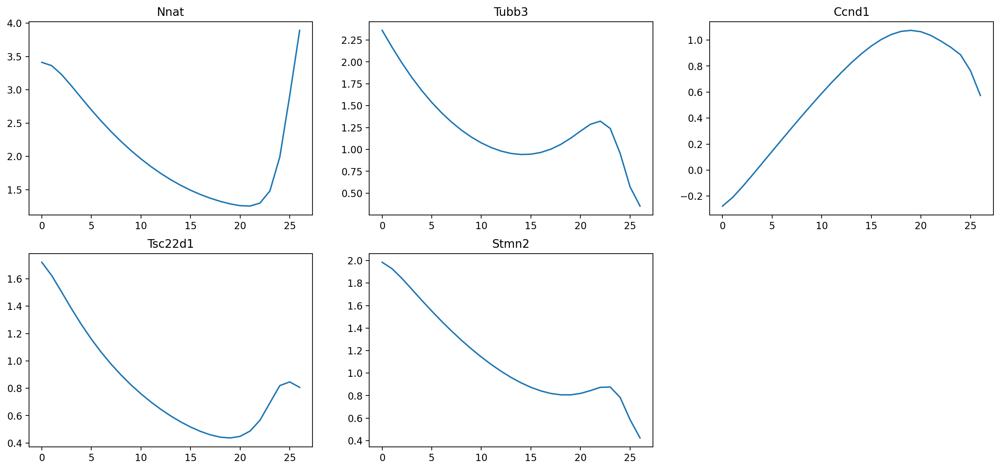

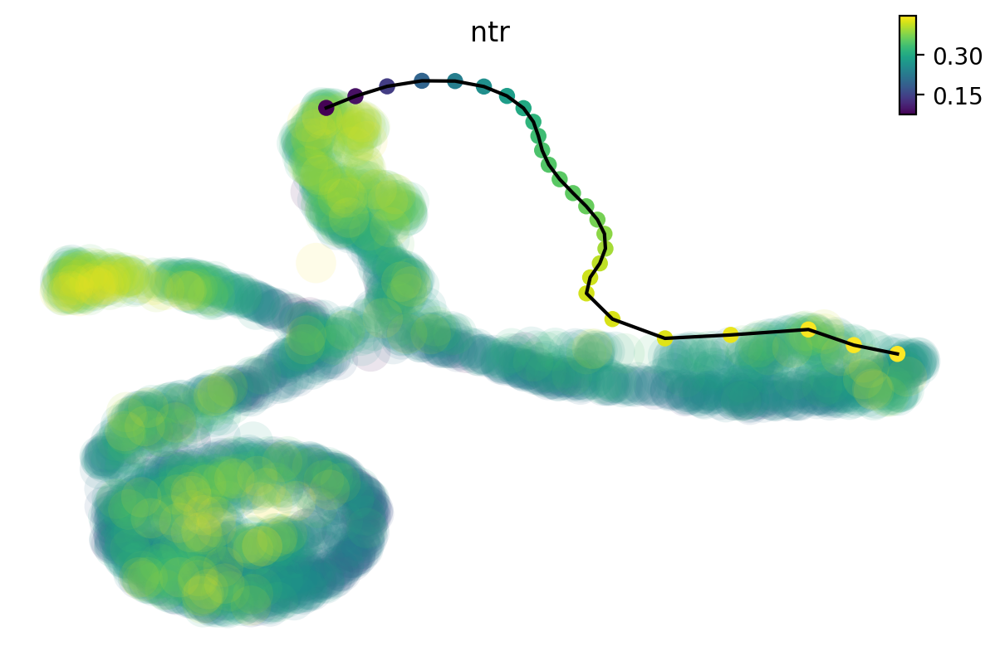

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.059123
|-----> [iterating through 1 pairs] completed [27.5962s]
|-----> [least action path] completed [27.5976s]
[[ 234 1468  740 1278 2295]] -> [[ 801 1246 1342 1835  155]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.235017
|-----> [iterating through 1 pairs] completed [0.7978s]
|-----> [least action path] completed [0.7989s]


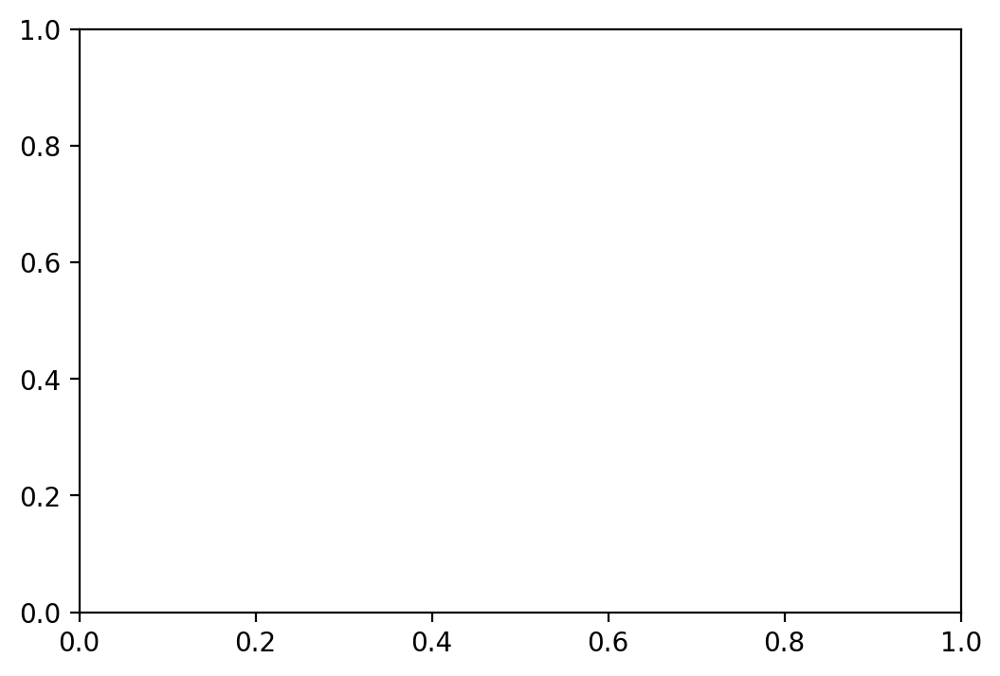

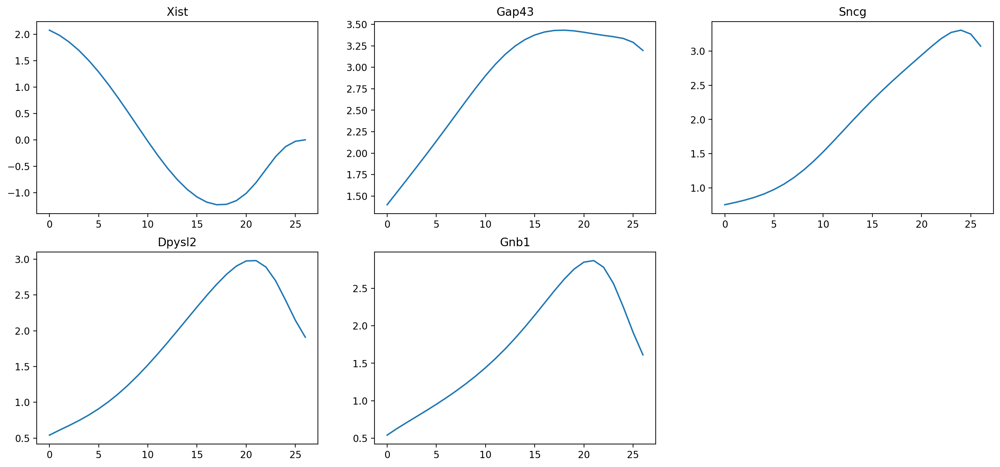

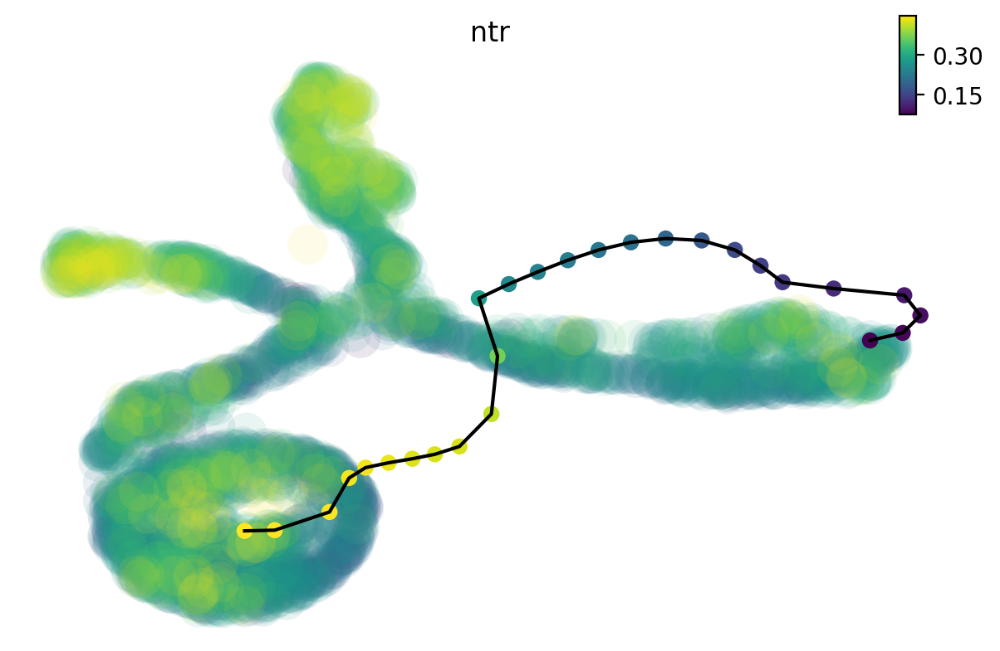

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.061661
|-----> [iterating through 1 pairs] completed [26.1525s]
|-----> [least action path] completed [26.1538s]
[[ 801 1246 1342 1835  155]] -> [[ 680 2587 1519  395  397]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.260094
|-----> [iterating through 1 pairs] completed [0.7372s]
|-----> [least action path] completed [0.7385s]


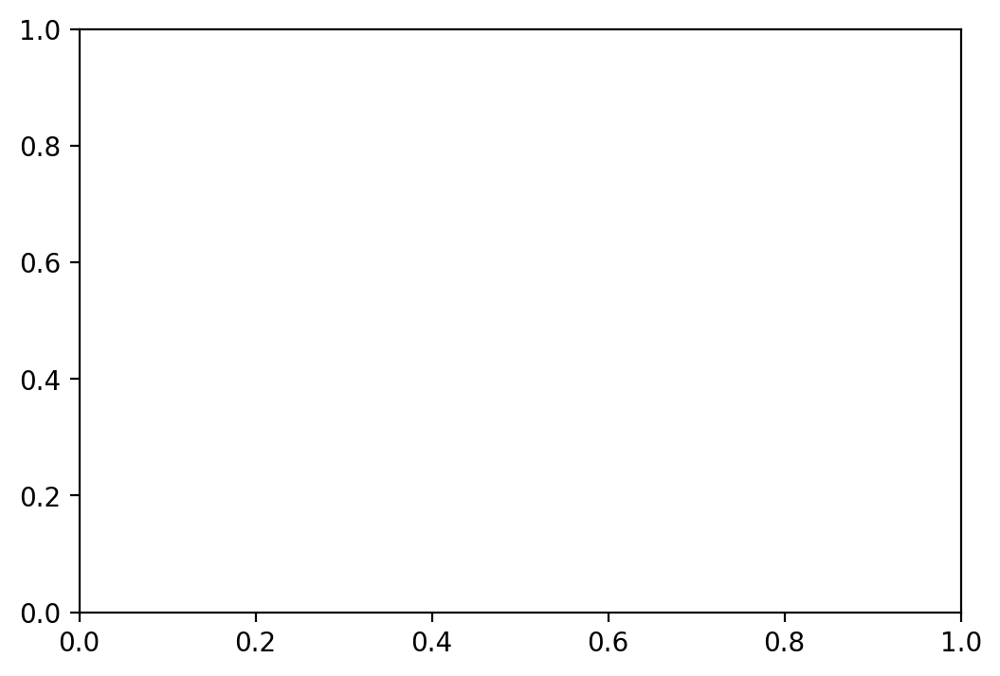

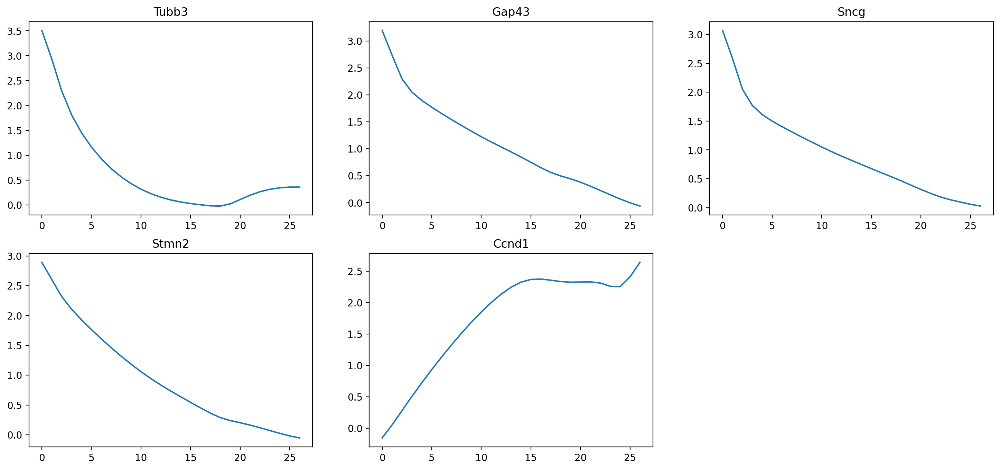

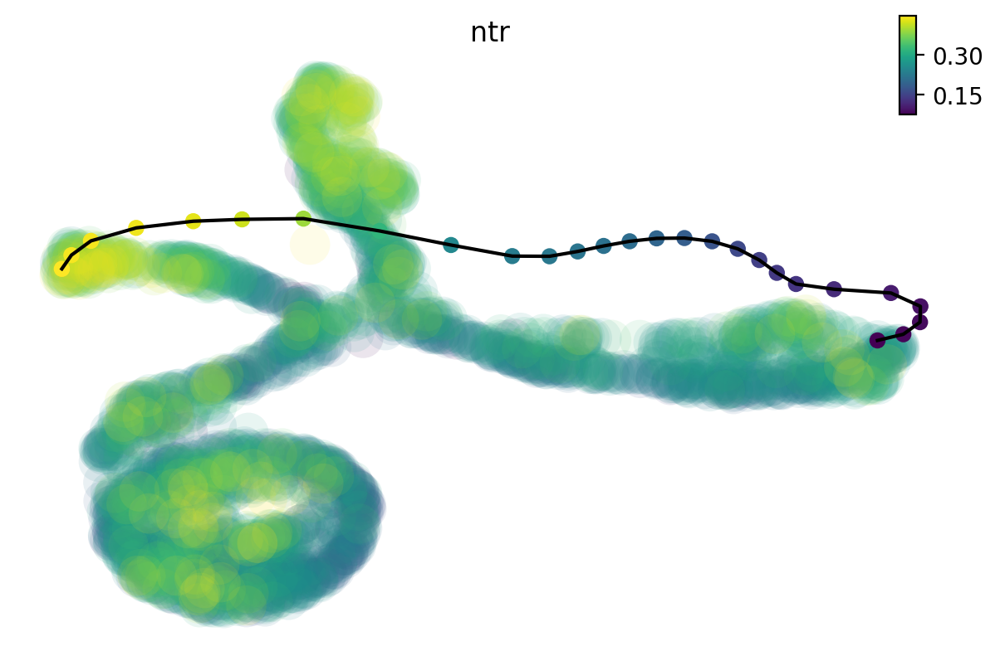

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.072935
|-----> [iterating through 1 pairs] completed [24.0500s]
|-----> [least action path] completed [24.0513s]
[[ 801 1246 1342 1835  155]] -> [[ 337   56 1163 2329 1080]]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.080804
|-----> [iterating through 1 pairs] completed [0.9181s]
|-----> [least action path] completed [0.9194s]


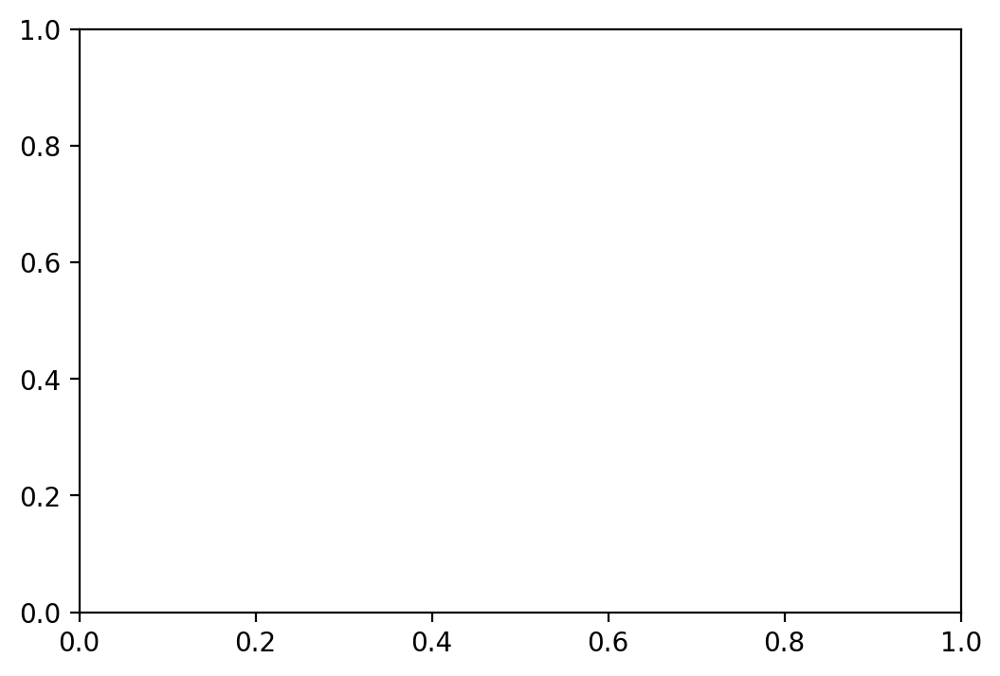

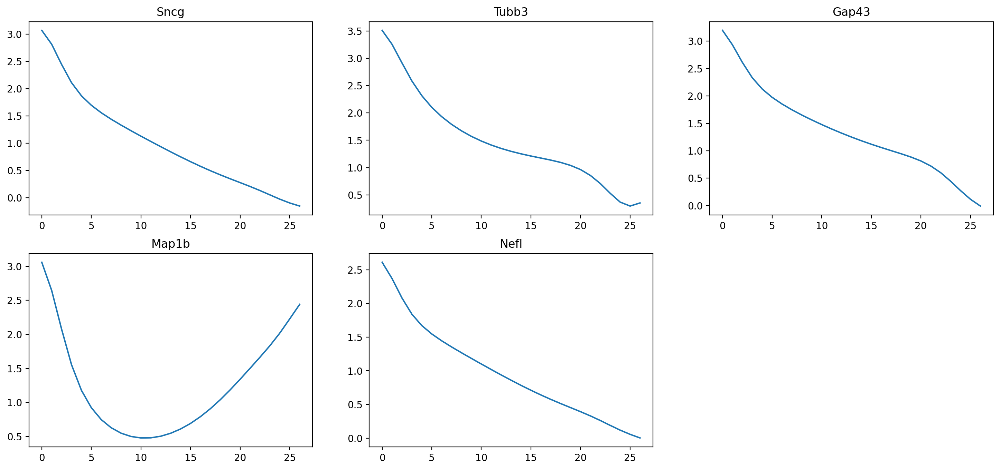

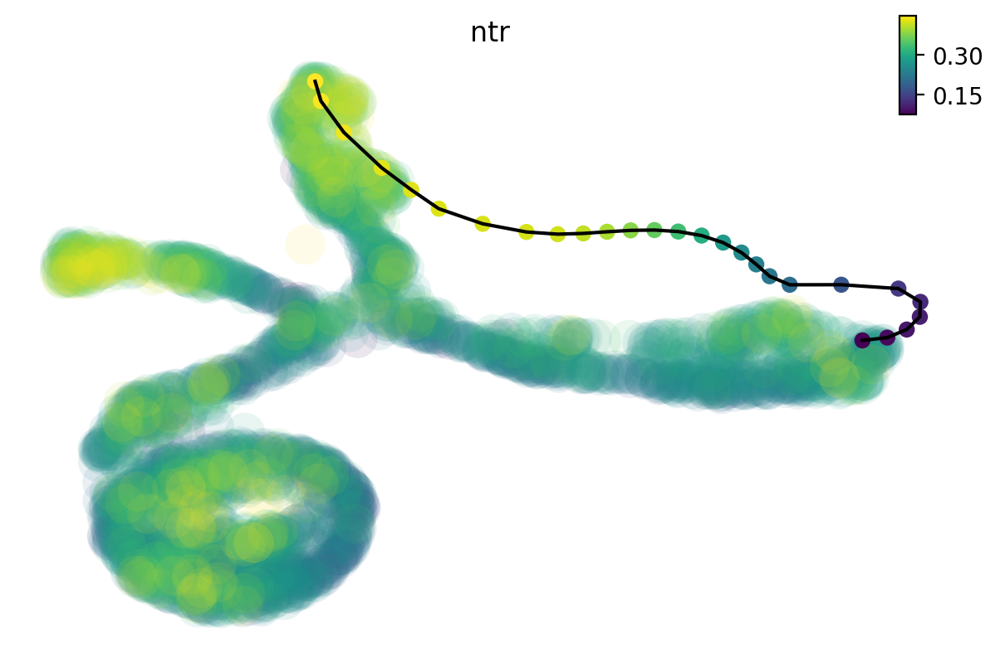

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.058156
|-----> [iterating through 1 pairs] completed [25.3636s]
|-----> [least action path] completed [25.3652s]
[[ 801 1246 1342 1835  155]] -> [[ 234 1468  740 1278 2295]]


In [20]:
import matplotlib.pyplot as plt
dyn.dynamo_logger.main_silence()
transition_graph = {}
cell_type = ["Progenitor", "PR", "AC_HC", "RGC"]
start_cell_indices = [
    Progenitor_cells_indices,
    PR_cells_indices,
    AC_HC_cells_indices,
    RGC_cells_indices,
]
end_cell_indices = start_cell_indices
for i, start in enumerate(start_cell_indices):
    for j, end in enumerate(end_cell_indices):
        if start is not end:
            min_lap_t = True if i == 0 else False
            dyn.pd.least_action(
                adata,
                [adata.obs_names[start[0]][0]],
                [adata.obs_names[end[0]][0]],
                basis="umap",
                adj_key="umap_distances",
                min_lap_t= min_lap_t,
                EM_steps=2,
            )
            dyn.pl.least_action(adata, basis="umap")
            lap = dyn.pd.least_action(
                adata,
                [adata.obs_names[start[0]][0]],
                [adata.obs_names[end[0]][0]],
                basis="pca",
                adj_key="cosine_transition_matrix",
                min_lap_t=min_lap_t,
                EM_steps=2,
            )
            # The `GeneTrajectory` class can be used to output trajectories for any set of genes of interest
            gtraj = dyn.pd.GeneTrajectory(adata)
            gtraj.from_pca(lap.X, t=lap.t)
            gtraj.calc_msd()
            ranking = dyn.vf.rank_genes(adata, "traj_msd")

            print(start, "->", end)
            genes = ranking[:5]["all"].to_list()
            arr = gtraj.select_gene(genes)
            
            fig, ax = plt.subplots(figsize=(6, 4))
            ax = dyn.pl.multiplot(lambda k: [plt.plot(arr[k, :]), plt.title(genes[k])], np.arange(len(genes)),
                            )
            plt.savefig('/home/datadisk/zlg/singlecell/stemcell_cycle_differentiation/figure/GeneTrajectory_rank5_' + cell_type[i]+ "-" + cell_type[j] + '.pdf')


            transition_graph[cell_type[i] + "->" + cell_type[j]] = {
                "lap": lap,
                "LAP_umap": adata.uns["LAP_umap"],
                "LAP_pca": adata.uns["LAP_pca"],
                "ranking": ranking,
                "gtraj": gtraj,
            }

### Visualize LAPs based on umap

In [21]:
from dynamo.plot.utils import map2color
def plotsave_lap(paths):
    fig, ax = plt.subplots(figsize=(6, 4))
    ax = dyn.pl.topography(
        adata, markersize=300, 
        basis="umap", 
        save_show_or_return="return", 
        ax=ax, 
        fps_basis="umap", 
        color="Annotation", 
        streamline_alpha=1, 
        frontier=False
    )
    #ax = ax[0]
    x, y = 0, 1

    # plot paths
    for path in paths:
        lap_dict = transition_graph[path]["LAP_umap"]
        for prediction, action in zip(lap_dict["prediction"], lap_dict["action"]):
            ax.scatter(*prediction[:, [x, y]].T, c=map2color(action))
            ax.plot(*prediction[:, [x, y]].T, c="k")
    plt.savefig('/home/datadisk/zlg/singlecell/stemcell_cycle_differentiation/figure/retina_all_LAP.pdf')

In [23]:
all_keys = ["Progenitor->PR", "Progenitor->AC_HC", "Progenitor->RGC",
           "PR->Progenitor", "AC_HC->Progenitor", "RGC->Progenitor",
           "PR->AC_HC", "PR->RGC", "AC_HC->PR", "AC_HC->RGC", "RGC->PR", "RGC->AC_HC",]

In [23]:
plotsave_lap(all_keys)

### Plotting the umap action values and integrals along path

In [42]:
# Plotting the provided array of umap action values

import matplotlib.pyplot as plt
for i, start in enumerate(start_cell_indices):
    for j, end in enumerate(end_cell_indices):
        if start is not end:
            umap_action_integrals = np.array(transition_graph[cell_type[i] + "->" + cell_type[j]]['LAP_umap']['action'])
            umap_action_integrals = umap_action_integrals[0]
            umap_action_values = np.diff(umap_action_integrals)

            fig=plt.figure(figsize=(3, 3))
            ax1 = fig.add_subplot(111)
            line1, = ax1.plot(umap_action_integrals, marker='o', label='Action Integral')
            ax1.set_ylabel('Action Integral')
            ax1.set_xlabel('Path')
            ax2 = ax1.twinx()
            line2, = ax2.plot(np.linspace(1,26,26), umap_action_values, color='darkorange', marker='o', label='Action Value')
            ax2.set_ylabel('Action Value')
            plt.grid(True)
            plt.legend(handles = [line1, line2])
            plt.savefig('/home/datadisk/zlg/singlecell/stemcell_cycle_differentiation/figure/action_' + cell_type[i]+ "-" + cell_type[j] + 'umap.pdf')

In [48]:
# Save the umap path to csv

for i, start in enumerate(start_cell_indices):
    for j, end in enumerate(end_cell_indices):
        if start is not end:
            path = np.array(transition_graph[cell_type[i] + "->" + cell_type[j]]['LAP_umap']['prediction'])
            path = path[0]
            
            df = pd.DataFrame(path, columns=['X', 'Y'])

            # Save to a CSV file
            df.to_csv('/home/datadisk/zlg/singlecell/stemcell_cycle_differentiation/figure/pathcoordinates_' + cell_type[i]+ "-" + cell_type[j] + '.csv', index=False)

In [ ]:
# Plotting the provided array of action values

import matplotlib.pyplot as plt
for i, start in enumerate(start_cell_indices):
    for j, end in enumerate(end_cell_indices):
        if start is not end:
            pca_action_integrals = np.array(transition_graph[cell_type[i] + "->" + cell_type[j]]['LAP_pca']['action'])
            pca_action_integrals = pca_action_integrals[0]
            pca_action_values = np.diff(pca_action_integrals)

            fig=plt.figure(figsize=(3, 3))
            ax1 = fig.add_subplot(111)
            line1, = ax1.plot(pca_action_integrals, marker='o', label='Action Integral')
            ax1.set_ylabel('Action Integral')
            ax1.set_xlabel('Path')
            ax2 = ax1.twinx()
            line2, = ax2.plot(np.linspace(1,26,26), pca_action_values, color='darkorange', marker='o', label='Action Value')
            ax2.set_ylabel('Action Value')
            plt.grid(True)
            plt.legend(handles = [line1, line2])
            plt.savefig('/home/datadisk/zlg/singlecell/stemcell_cycle_differentiation/figure/action_' + cell_type[i]+ "-" + cell_type[j] + '_pca.pdf')

### Visualize RNA velocity based on pca

|-----------> plotting with basis key=X_pca
|-----------> skip filtering Annotation by stack threshold when stacking color because it is not a numeric type


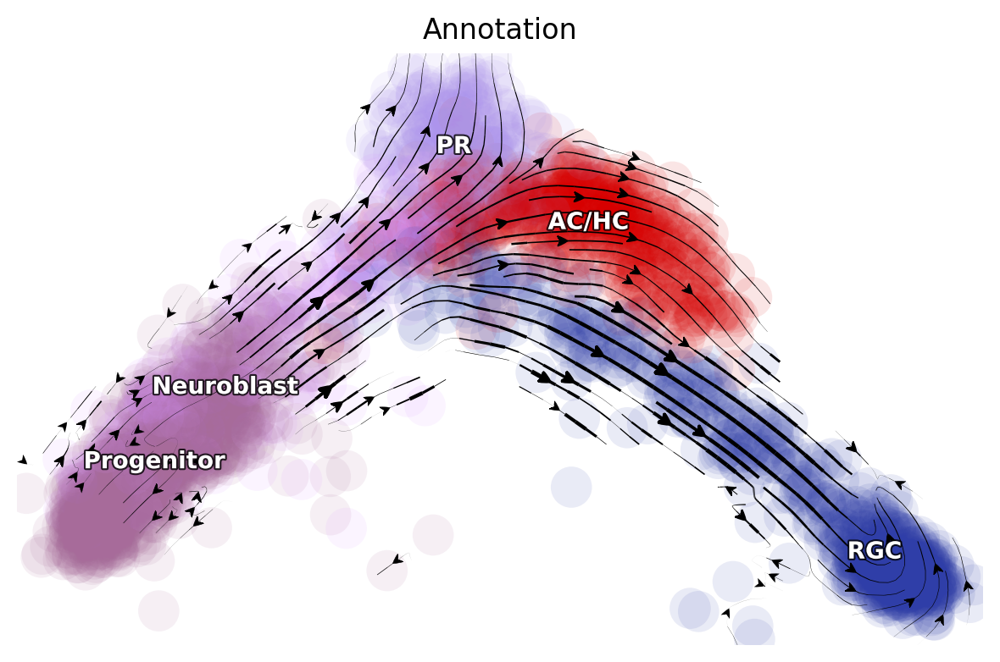

In [15]:
dyn.pl.streamline_plot(
    adata,
    color="Annotation",
    basis="pca",
)

### Run pairwise least action path analyses on pca

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.018330
|-----> [iterating through 1 pairs] completed [6.6378s]
|-----> [least action path] completed [6.6392s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.036261
|-----> [iterating through 1 pairs] completed [137.8789s]
|-----> [least action path] completed [137.8806s]


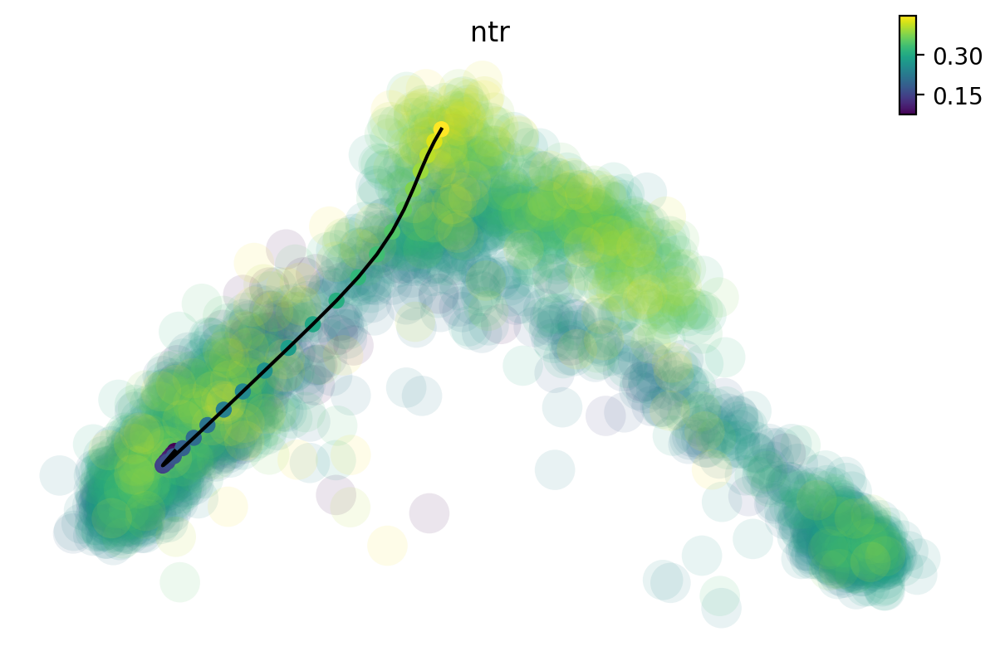

[[ 680 2587 1519  395  397]] -> [[ 337   56 1163 2329 1080]]


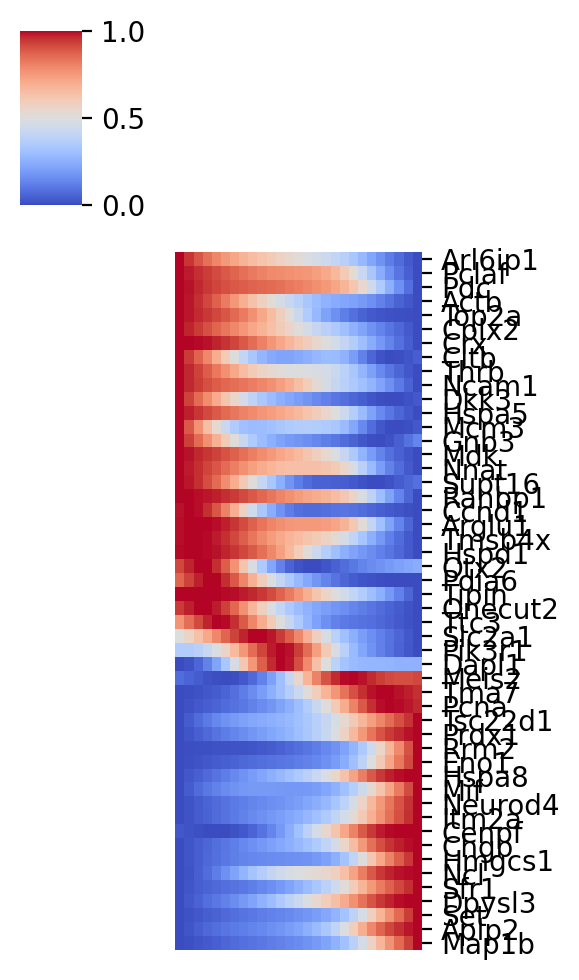

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.021343
|-----> [iterating through 1 pairs] completed [6.8929s]
|-----> [least action path] completed [6.8949s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.028734
|-----> [iterating through 1 pairs] completed [284.4049s]
|-----> [least action path] completed [284.4065s]


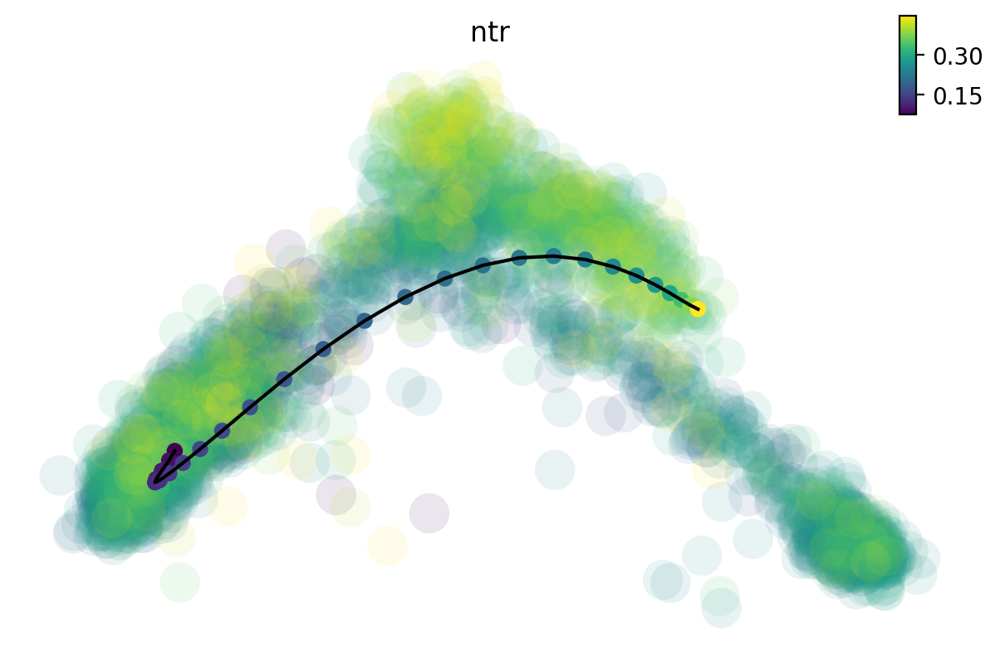

[[ 680 2587 1519  395  397]] -> [[ 234 1468  740 1278 2295]]


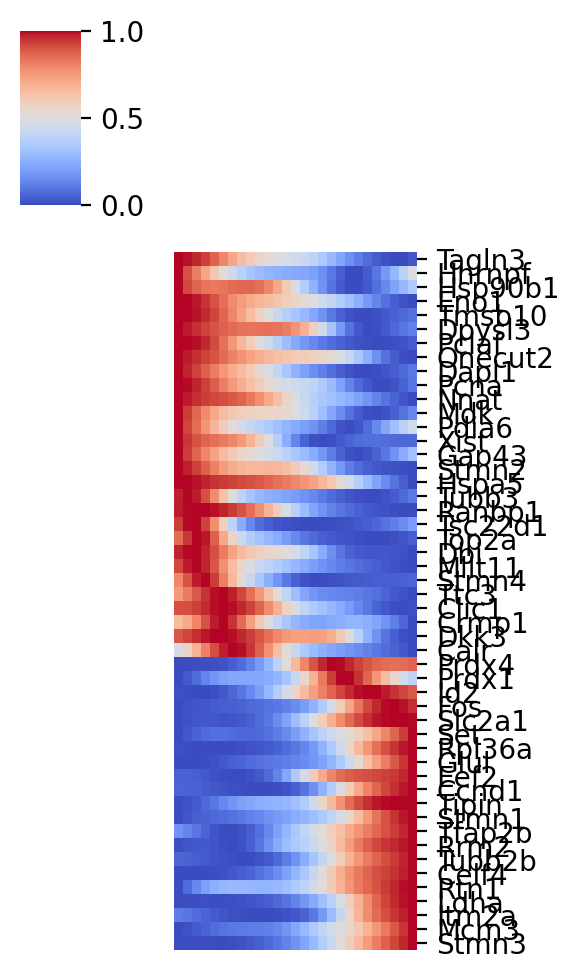

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.027842
|-----> [iterating through 1 pairs] completed [8.0493s]
|-----> [least action path] completed [8.0506s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.020429
|-----> [iterating through 1 pairs] completed [209.4600s]
|-----> [least action path] completed [209.4617s]


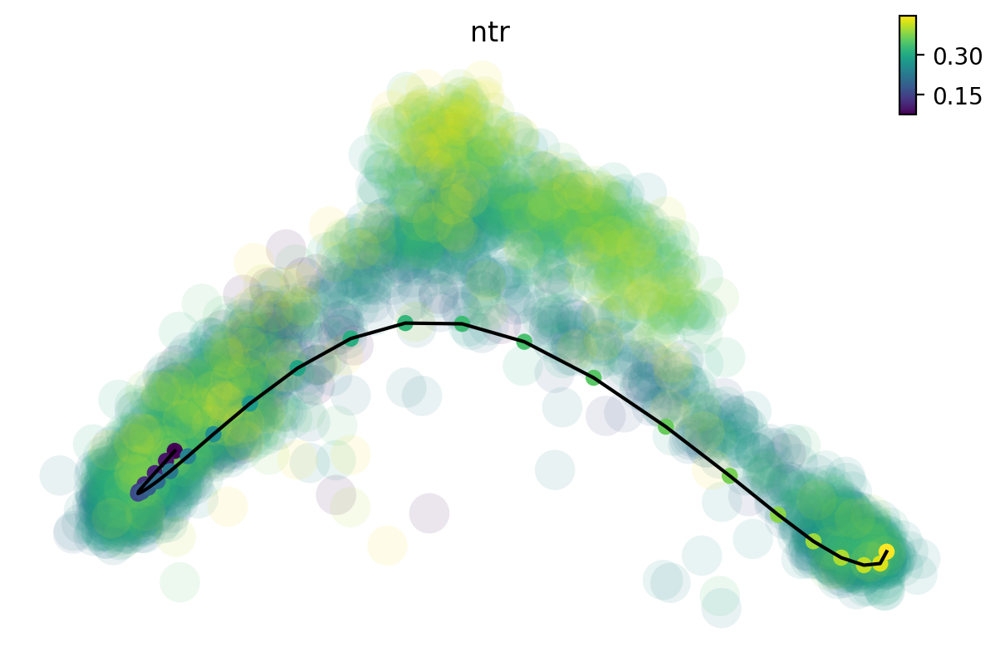

[[ 680 2587 1519  395  397]] -> [[ 801 1246 1342 1835  155]]


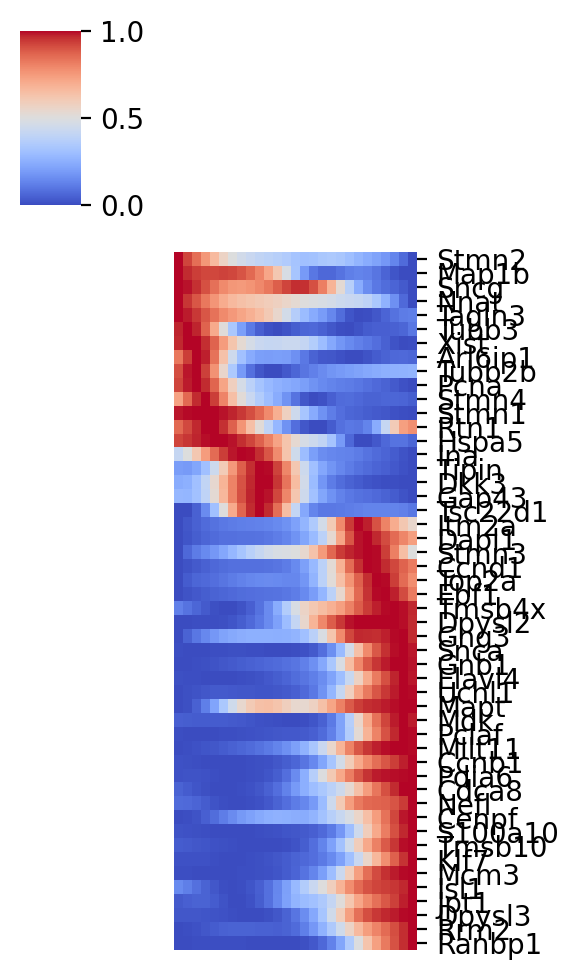

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.314228
|-----> [iterating through 1 pairs] completed [0.8102s]
|-----> [least action path] completed [0.8114s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.084275
|-----> [iterating through 1 pairs] completed [26.8431s]
|-----> [least action path] completed [26.8443s]


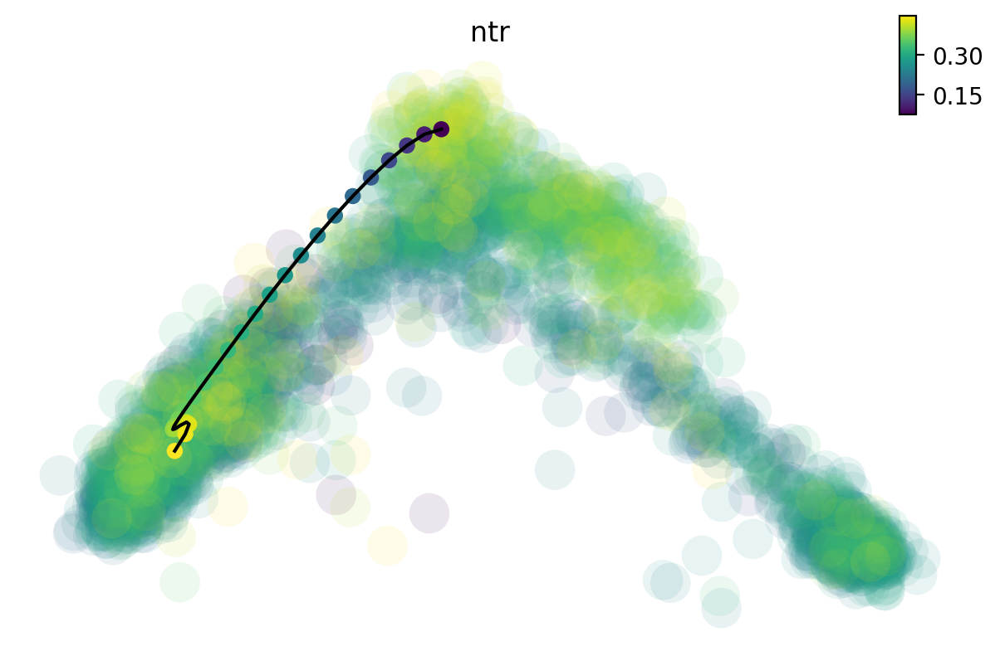

[[ 337   56 1163 2329 1080]] -> [[ 680 2587 1519  395  397]]


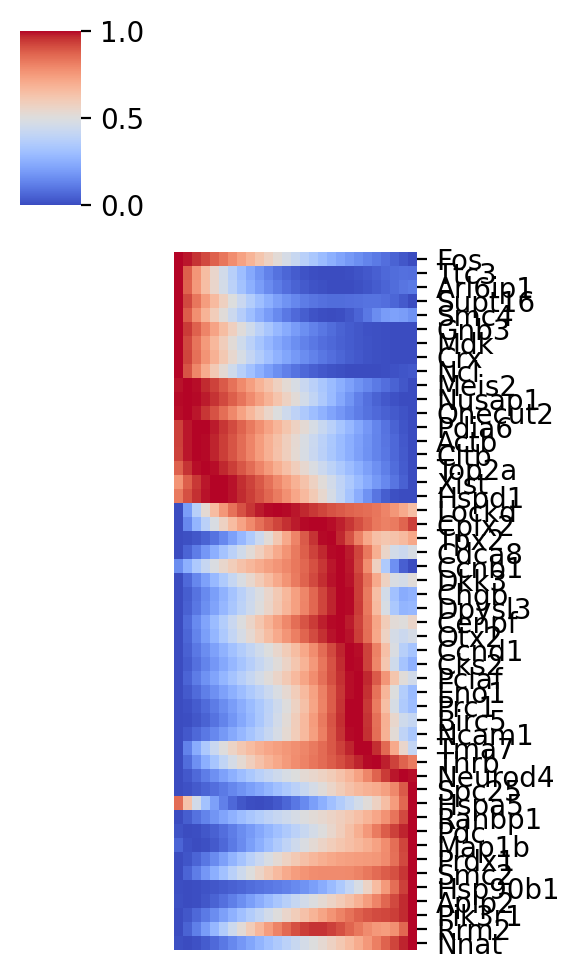

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.279096
|-----> [iterating through 1 pairs] completed [0.7574s]
|-----> [least action path] completed [0.7587s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.065863
|-----> [iterating through 1 pairs] completed [35.3882s]
|-----> [least action path] completed [35.3895s]


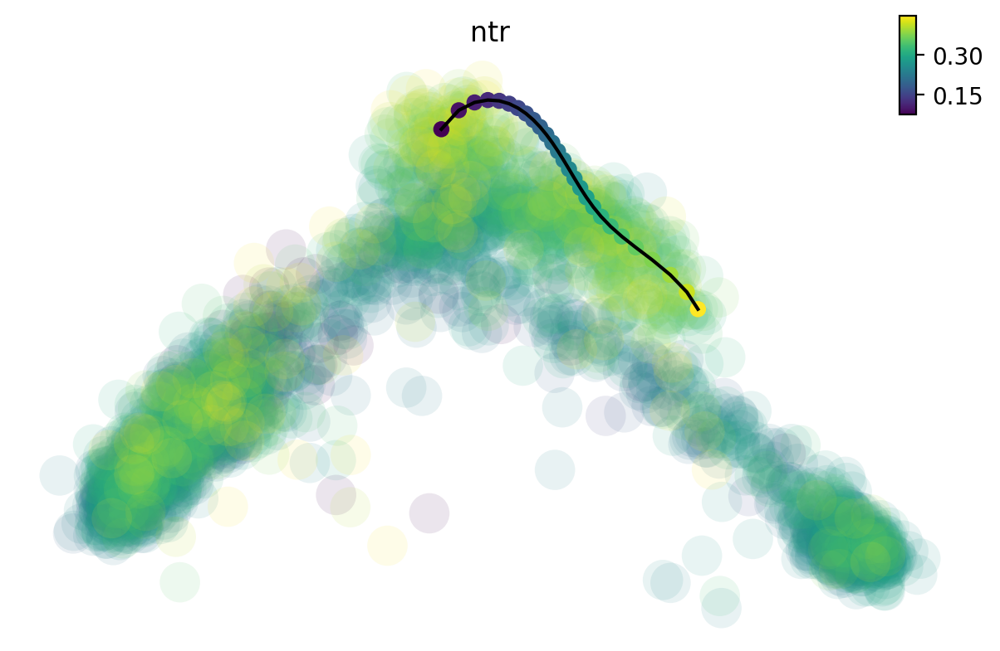

[[ 337   56 1163 2329 1080]] -> [[ 234 1468  740 1278 2295]]


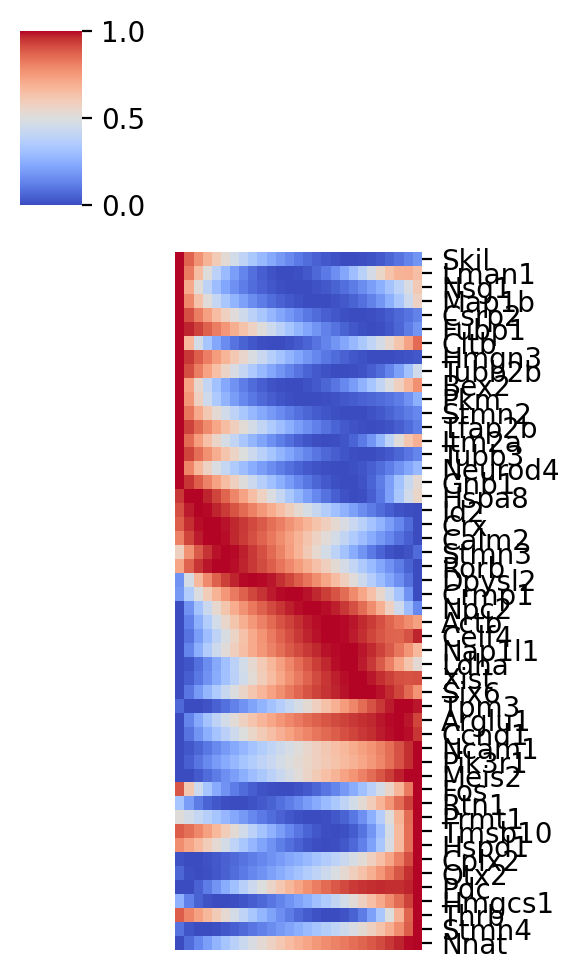

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.253052
|-----> [iterating through 1 pairs] completed [1.0481s]
|-----> [least action path] completed [1.0492s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.066154
|-----> [iterating through 1 pairs] completed [23.1449s]
|-----> [least action path] completed [23.1463s]


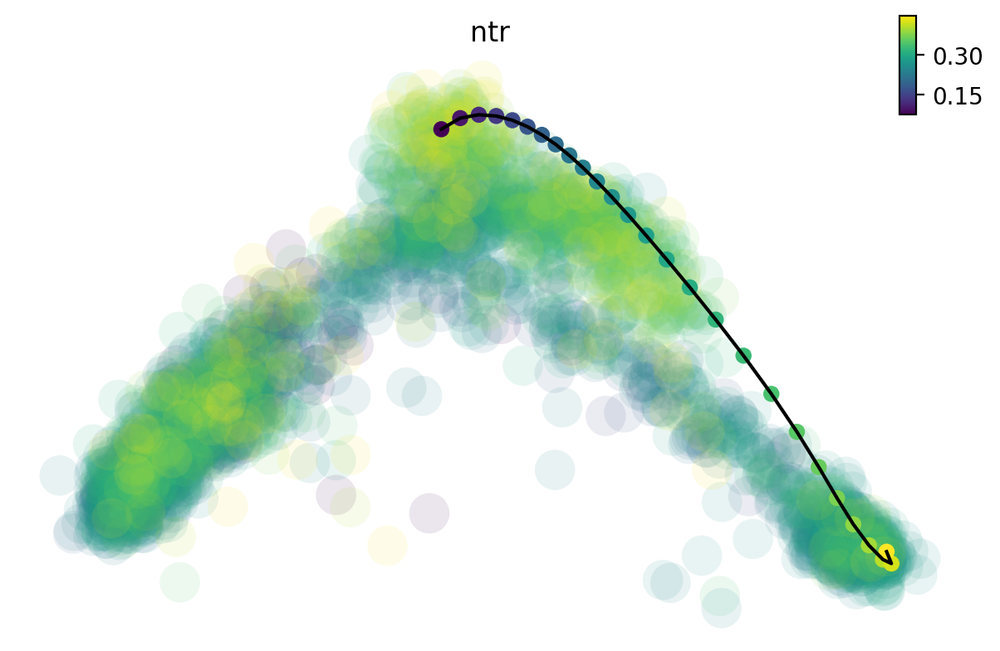

[[ 337   56 1163 2329 1080]] -> [[ 801 1246 1342 1835  155]]


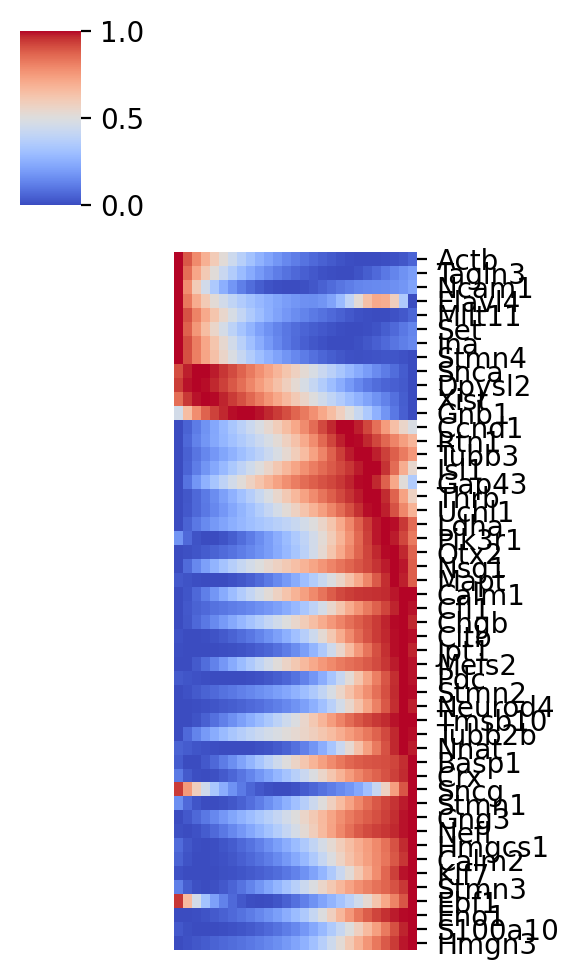

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 1.021310
|-----> [iterating through 1 pairs] completed [0.6601s]
|-----> [least action path] completed [0.6612s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.044003
|-----> [iterating through 1 pairs] completed [26.5712s]
|-----> [least action path] completed [26.5725s]


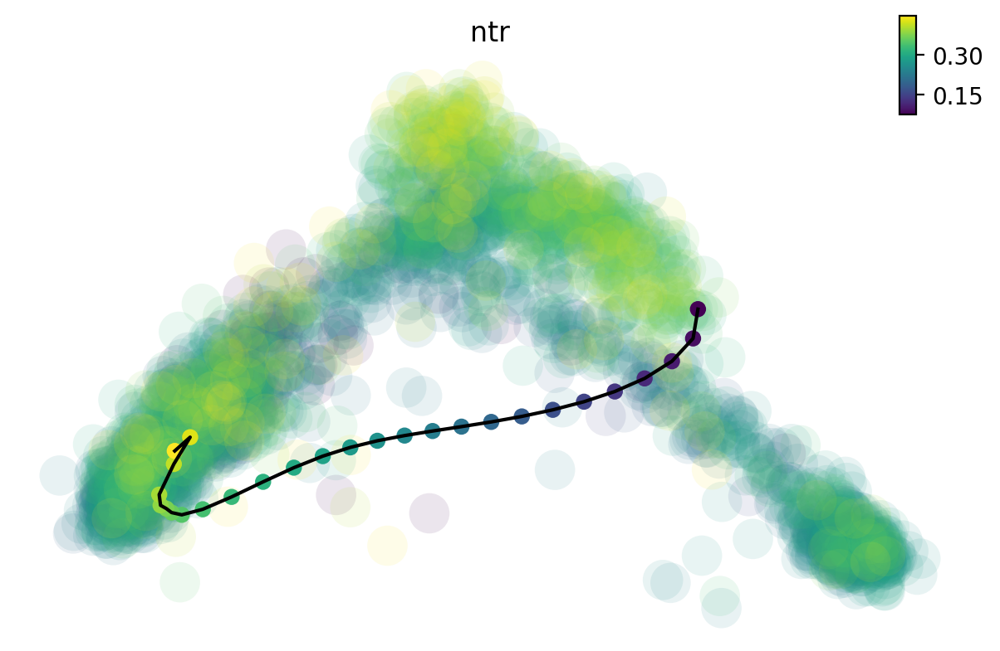

[[ 234 1468  740 1278 2295]] -> [[ 680 2587 1519  395  397]]


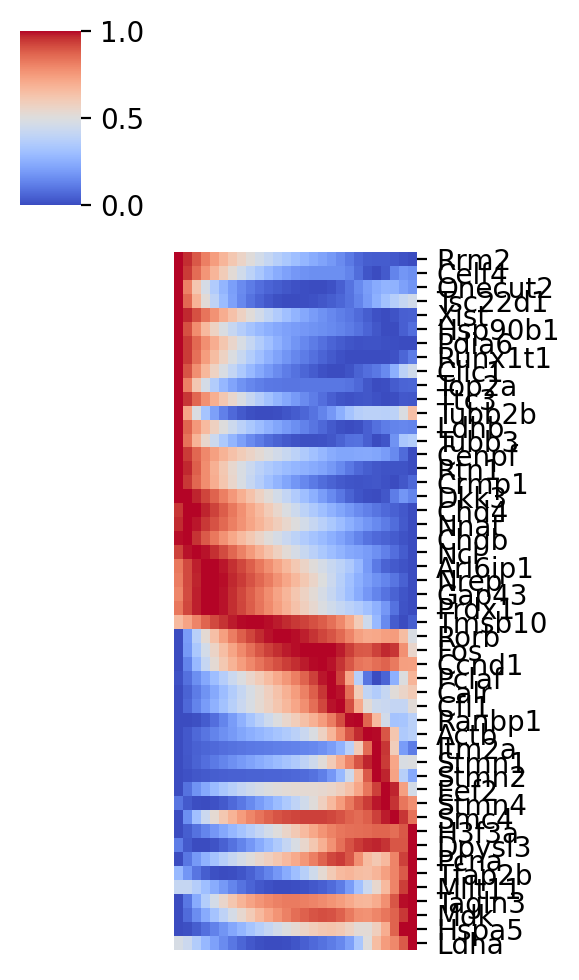

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.206037
|-----> [iterating through 1 pairs] completed [0.7016s]
|-----> [least action path] completed [0.7027s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.065376
|-----> [iterating through 1 pairs] completed [29.6486s]
|-----> [least action path] completed [29.6498s]


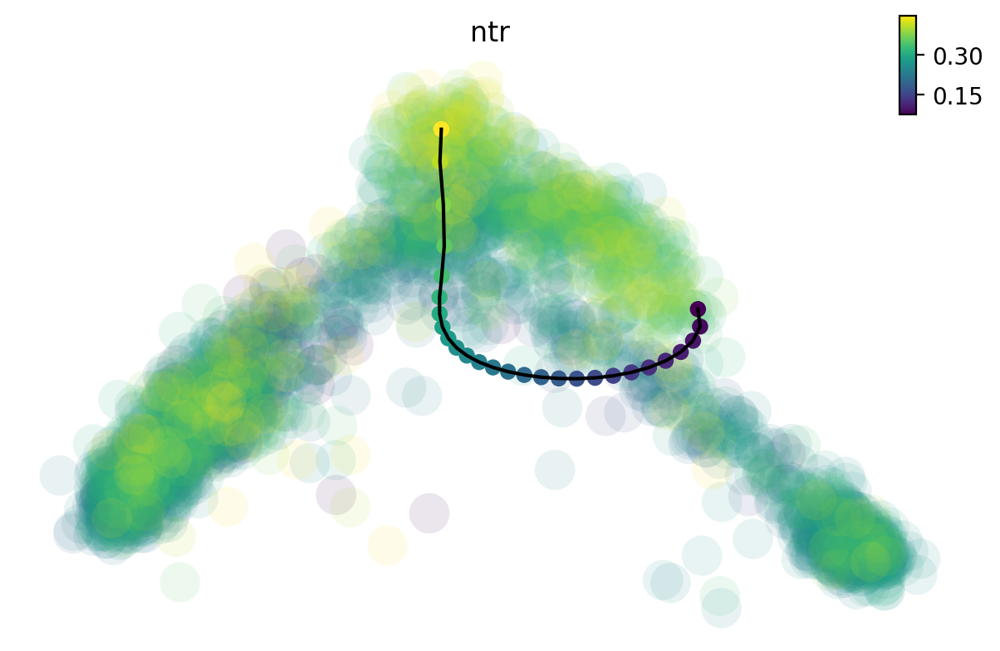

[[ 234 1468  740 1278 2295]] -> [[ 337   56 1163 2329 1080]]


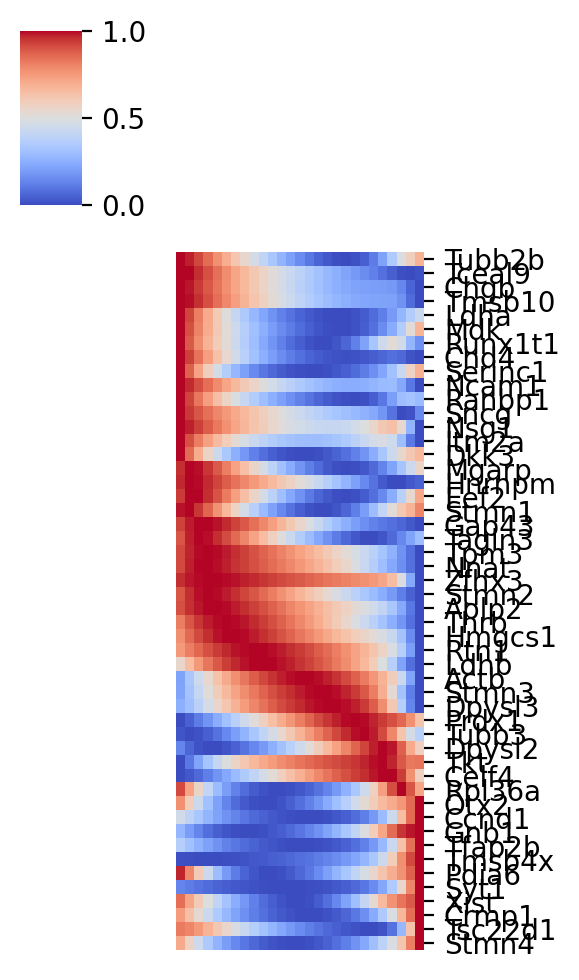

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.135130
|-----> [iterating through 1 pairs] completed [0.9092s]
|-----> [least action path] completed [0.9105s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.059123
|-----> [iterating through 1 pairs] completed [25.3089s]
|-----> [least action path] completed [25.3105s]


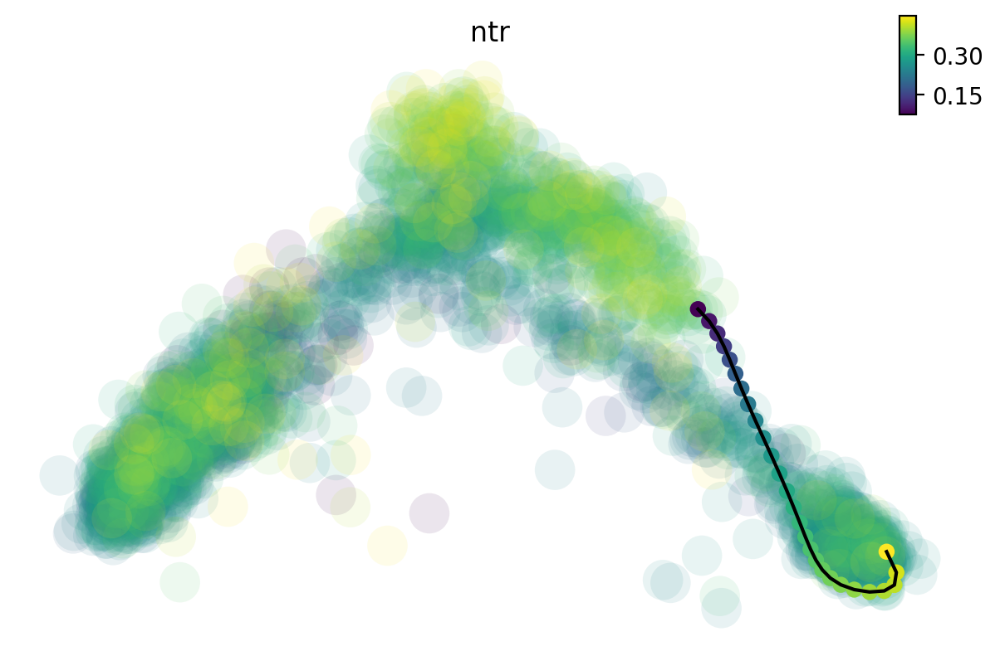

[[ 234 1468  740 1278 2295]] -> [[ 801 1246 1342 1835  155]]


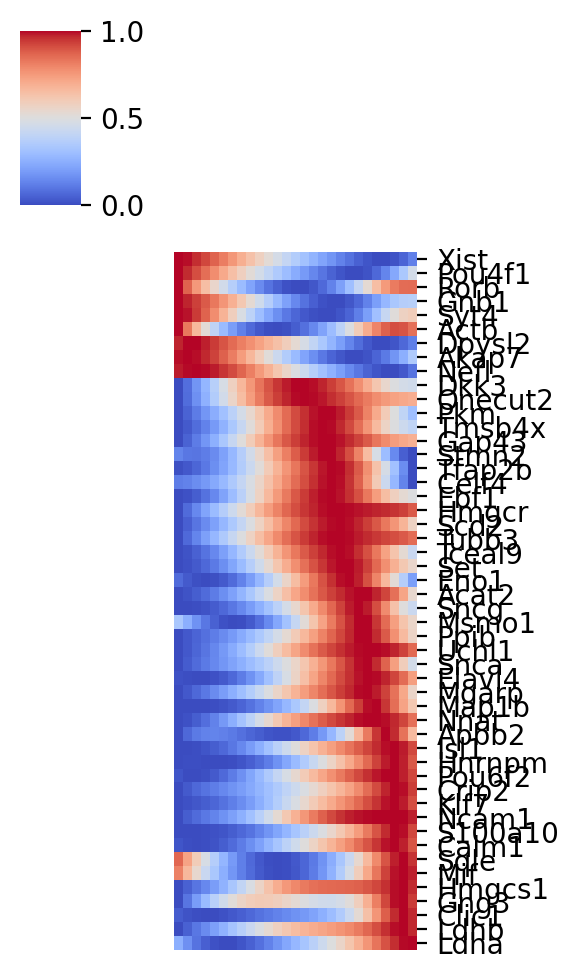

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.235017
|-----> [iterating through 1 pairs] completed [0.8411s]
|-----> [least action path] completed [0.8422s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.061661
|-----> [iterating through 1 pairs] completed [24.1134s]
|-----> [least action path] completed [24.1146s]


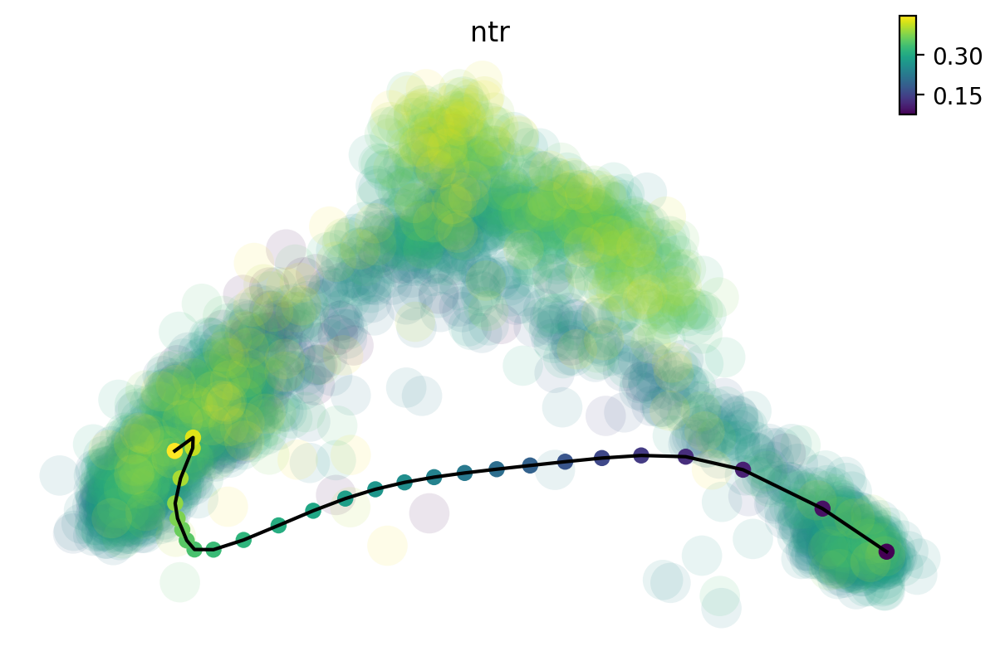

[[ 801 1246 1342 1835  155]] -> [[ 680 2587 1519  395  397]]


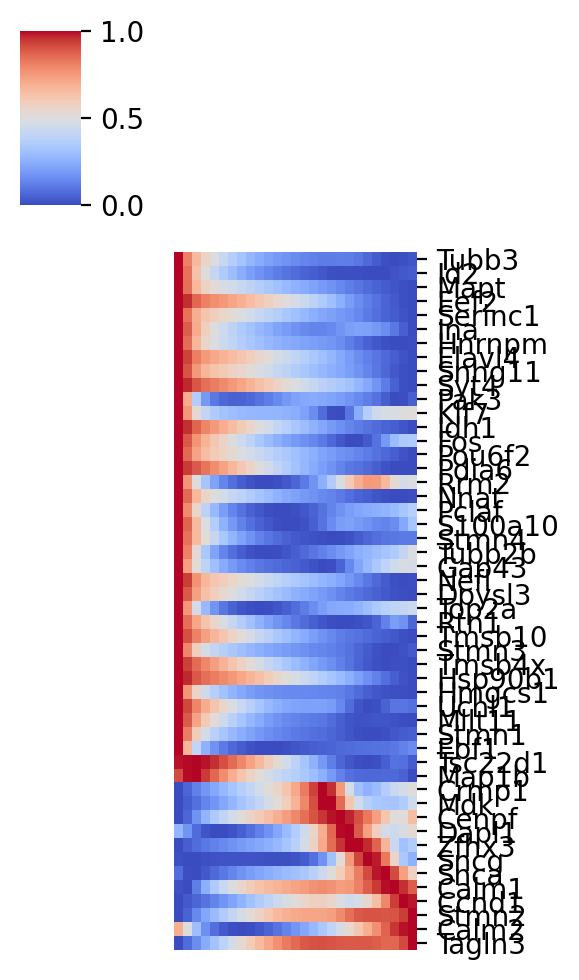

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.260094
|-----> [iterating through 1 pairs] completed [0.7857s]
|-----> [least action path] completed [0.7869s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.072935
|-----> [iterating through 1 pairs] completed [24.6734s]
|-----> [least action path] completed [24.6748s]


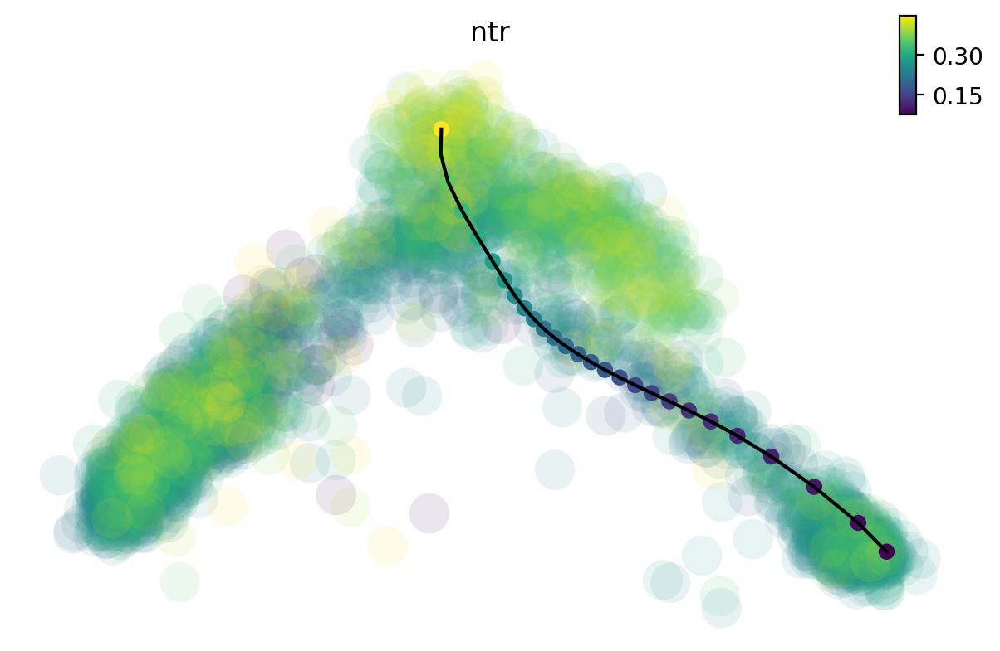

[[ 801 1246 1342 1835  155]] -> [[ 337   56 1163 2329 1080]]


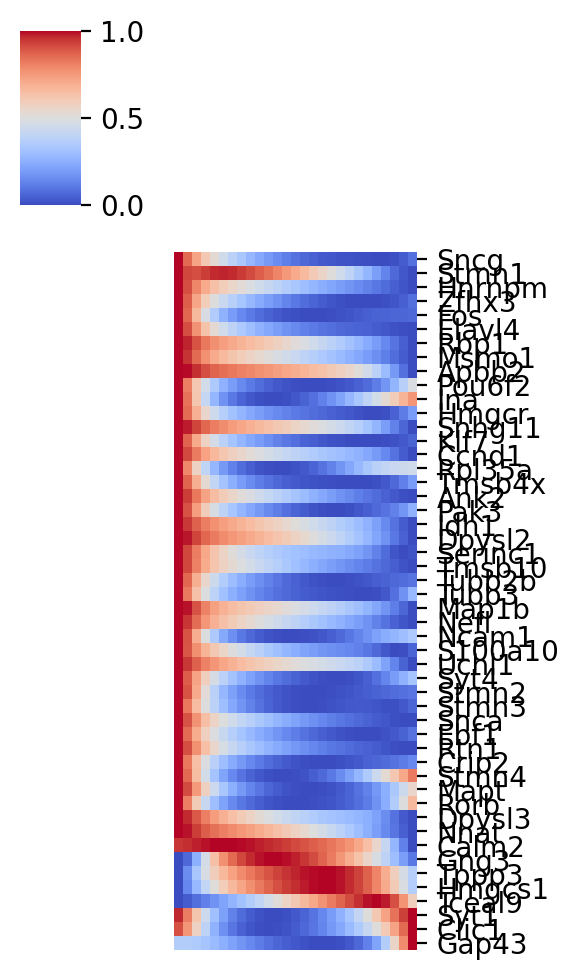

|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.080804
|-----> [iterating through 1 pairs] completed [0.9119s]
|-----> [least action path] completed [0.9132s]
|-----> searching for the least action path...
|-----> [iterating through 1 pairs] in progress: 100.0000%|-----------> initializing path with the shortest path in the graph built from the velocity transition matrix...
|-----------> optimizing for least action path...
|-----> optimal action: 0.058156
|-----> [iterating through 1 pairs] completed [26.2383s]
|-----> [least action path] completed [26.2396s]


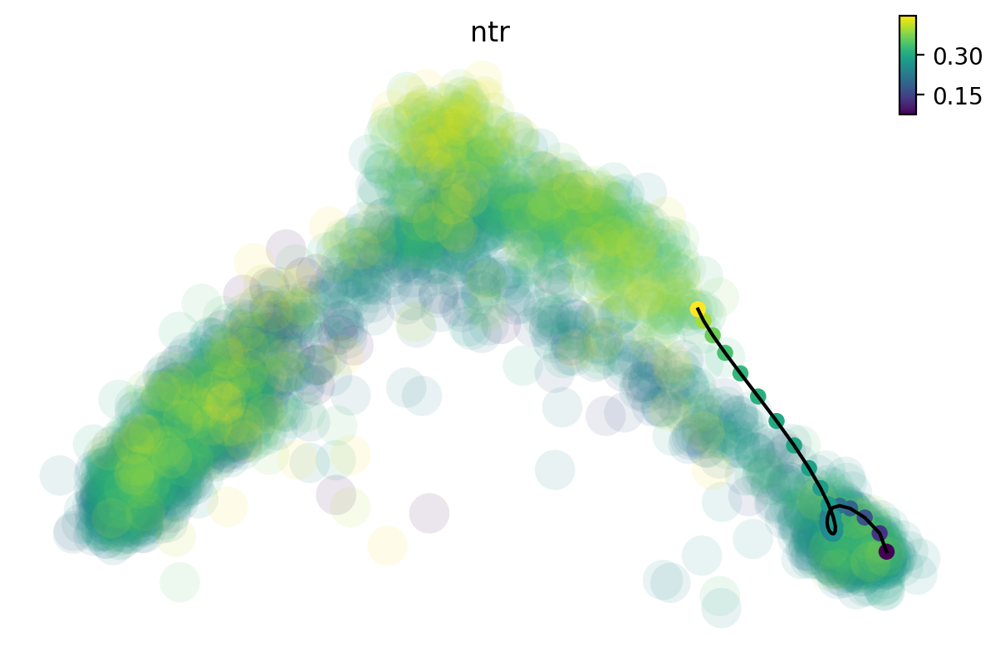

[[ 801 1246 1342 1835  155]] -> [[ 234 1468  740 1278 2295]]


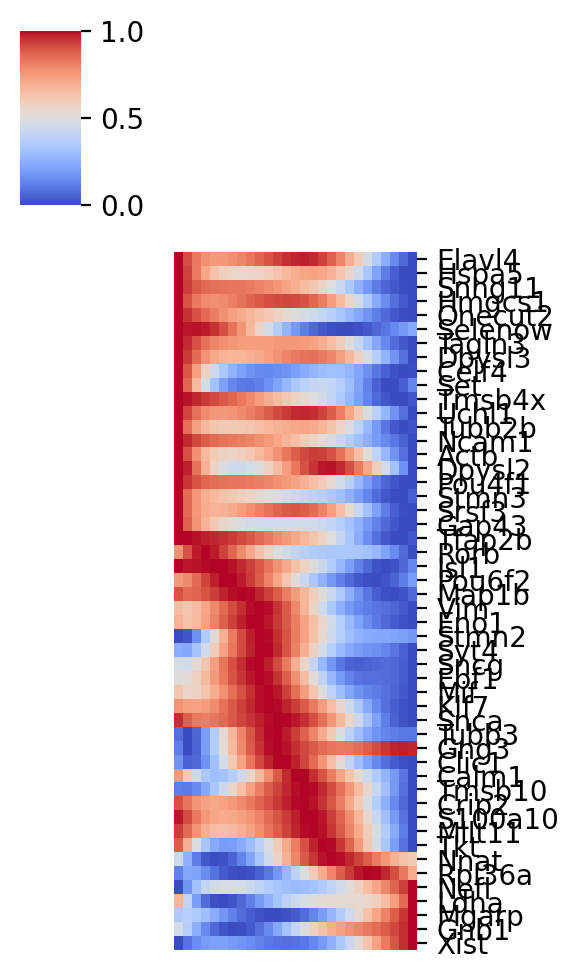

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
dyn.dynamo_logger.main_silence()
transition_graph = {}
cell_type = ["Progenitor", "PR", "AC_HC", "RGC"]
start_cell_indices = [
    Progenitor_cells_indices,
    PR_cells_indices,
    AC_HC_cells_indices,
    RGC_cells_indices,
]
end_cell_indices = start_cell_indices
for i, start in enumerate(start_cell_indices):
    for j, end in enumerate(end_cell_indices):
        if start is not end:
            min_lap_t = True if i == 0 else False
            lap_umap = dyn.pd.least_action(
                adata,
                [adata.obs_names[start[0]][0]],
                [adata.obs_names[end[0]][0]],
                basis="umap",
                adj_key="umap_distances",
                min_lap_t= min_lap_t,
                EM_steps=2,
            )
            
            lap_pca = dyn.pd.least_action(
                adata,
                [adata.obs_names[start[0]][0]],
                [adata.obs_names[end[0]][0]],
                basis="pca",
                adj_key="cosine_transition_matrix",
                min_lap_t=min_lap_t,
                EM_steps=2,
            )
            dyn.pl.least_action(adata, basis="pca")
            # The `GeneTrajectory` class can be used to output trajectories for any set of genes of interest
            gtraj = dyn.pd.GeneTrajectory(adata)
            gtraj.from_pca(lap_pca.X, t=lap_pca.t)
            gtraj.calc_msd()
            ranking = dyn.vf.rank_genes(adata, "traj_msd")

            print(start, "->", end)
            genes = ranking[:50]["all"].to_list()
            arr = gtraj.select_gene(genes)
            dyn.pl.kinetic_heatmap(adata,
                       basis="pca",
                       mode="lap",
                       genes=genes,
                       project_back_to_high_dim=True,
                       color_map="coolwarm",
                       figsize=(3, 5),
                       show_colorbar=True,
                       #standard_scale=0.6,
                       xticklabels=False,
                       yticklabels=True,
                       save_show_or_return="show")
            
            transition_graph[cell_type[i] + "->" + cell_type[j]] = {
                "genekinetics_lap_pca": adata.uns['kinetics_heatmap'],
                "lap_pca": lap_pca,
                "lap_umap": lap_umap,
                "LAP_umap": adata.uns["LAP_umap"],
                "LAP_pca": adata.uns["LAP_pca"],
                "ranking": ranking,
                "gtraj": gtraj,
            }

In [21]:
transition_graph["Progenitor->PR"]["genekinetics_lap_pca"]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26
Arl6ip1,1.000000,0.946558,0.893456,0.842193,0.794523,0.751922,0.715010,0.683116,0.654654,0.627700,0.600863,0.573431,0.545259,0.516833,0.488889,0.462026,0.435649,0.407111,0.372606,0.329509,0.278137,0.222068,0.166381,0.115205,0.070509,0.032379,0.000000
Pclaf,1.000000,0.978314,0.956641,0.934855,0.912659,0.889790,0.866425,0.843354,0.821935,0.803484,0.788818,0.777944,0.770007,0.763134,0.754090,0.738214,0.710177,0.665439,0.601719,0.520108,0.426158,0.329237,0.238963,0.161099,0.096681,0.043867,0.000000
Pdc,1.000000,0.984432,0.964880,0.943334,0.922287,0.904017,0.889739,0.879075,0.870466,0.861948,0.852159,0.840449,0.826696,0.811081,0.793657,0.774072,0.750883,0.720624,0.678114,0.618520,0.540287,0.447591,0.348924,0.252328,0.161981,0.078308,0.000000
Actb,1.000000,0.982322,0.955171,0.918165,0.871629,0.816932,0.756715,0.694446,0.633497,0.575978,0.522315,0.471700,0.423022,0.375748,0.330719,0.290426,0.258081,0.235318,0.220215,0.207314,0.189806,0.163235,0.128385,0.090269,0.054300,0.023833,0.000000
Top2a,1.000000,0.981944,0.963431,0.943335,0.920238,0.892568,0.858841,0.818040,0.769776,0.714228,0.651798,0.583041,0.508796,0.430784,0.352292,0.278177,0.213457,0.160510,0.117919,0.082759,0.054032,0.033214,0.021031,0.015122,0.011589,0.007150,0.000000
Cplx2,1.000000,0.971318,0.939027,0.903675,0.866337,0.828335,0.790778,0.754070,0.717799,0.680869,0.642119,0.600687,0.556353,0.509912,0.463297,0.419152,0.379140,0.341903,0.303641,0.261324,0.215464,0.170152,0.129583,0.094723,0.063462,0.032698,0.000000
Crx,1.000000,0.999110,0.994883,0.986093,0.971529,0.950275,0.922043,0.887439,0.847959,0.805385,0.761339,0.716870,0.672558,0.628802,0.585992,0.544355,0.503368,0.460848,0.413582,0.359513,0.299749,0.238705,0.181210,0.129505,0.083158,0.040503,0.000000
Cltb,1.000000,0.939888,0.870084,0.789552,0.698663,0.600187,0.500159,0.406751,0.328134,0.269542,0.232588,0.215941,0.216695,0.231009,0.253568,0.276919,0.291290,0.286286,0.254832,0.197799,0.126803,0.061143,0.017252,0.000000,0.004014,0.020515,0.042017
Thrb,1.000000,0.966336,0.926408,0.880017,0.827538,0.770410,0.711611,0.655214,0.605409,0.565013,0.535026,0.514797,0.502593,0.495704,0.490112,0.480564,0.461720,0.430001,0.384908,0.328987,0.267135,0.205224,0.148339,0.099409,0.059062,0.026414,0.000000
Ncam1,1.000000,0.965608,0.933766,0.905398,0.881405,0.862041,0.846363,0.832080,0.816280,0.796299,0.770314,0.737176,0.696082,0.646784,0.590223,0.529677,0.470716,0.418970,0.376777,0.341520,0.306721,0.265947,0.216904,0.162025,0.105544,0.050902,0.000000


In [77]:
transition_graph["PR->Progenitor"]["genekinetics_lap_pca"]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26
Fos,1.000000,0.980494,0.952301,0.916493,0.874698,0.828477,0.779276,0.728250,0.676359,0.624356,0.572779,0.521967,0.472203,0.423755,0.376897,0.332046,0.289769,0.250762,0.215511,0.184266,0.156771,0.131828,0.107137,0.080655,0.052670,0.025542,0.000000
Ttc3,1.000000,0.875361,0.759700,0.651133,0.549914,0.456756,0.372406,0.297309,0.231643,0.175359,0.128159,0.089540,0.058901,0.035496,0.018599,0.007524,0.001572,0.000000,0.002195,0.007691,0.016593,0.029481,0.046370,0.064471,0.077900,0.082991,0.080999
Arl6ip1,1.000000,0.868985,0.751708,0.645670,0.549368,0.462049,0.383407,0.313228,0.251307,0.197413,0.151211,0.112263,0.080081,0.054094,0.033738,0.018508,0.007980,0.001857,0.000000,0.002380,0.009226,0.020911,0.037485,0.057601,0.077760,0.094850,0.108259
Supt16,1.000000,0.917461,0.829893,0.742058,0.656398,0.574442,0.497354,0.425974,0.360858,0.302424,0.250879,0.206306,0.168628,0.137687,0.113250,0.095188,0.083308,0.077349,0.076655,0.080073,0.085706,0.090521,0.089995,0.079903,0.059567,0.032271,0.000000
Smc4,1.000000,0.880597,0.775721,0.680715,0.593156,0.511903,0.436553,0.366914,0.302984,0.244736,0.192212,0.145374,0.104337,0.069213,0.040430,0.018608,0.004719,0.000000,0.006097,0.024612,0.056842,0.101797,0.152546,0.193596,0.209026,0.196200,0.164672
Gnb3,1.000000,0.940554,0.871673,0.798646,0.724304,0.650516,0.578770,0.510158,0.445518,0.385451,0.330345,0.280329,0.235371,0.195160,0.159321,0.127469,0.099339,0.074819,0.054098,0.037346,0.024596,0.015482,0.009086,0.004364,0.001147,0.000000,0.001114
Mdk,1.000000,0.917442,0.832256,0.748160,0.666758,0.589031,0.515802,0.447641,0.384975,0.328071,0.277047,0.231822,0.192227,0.157883,0.128370,0.103191,0.081865,0.063896,0.048895,0.036429,0.026125,0.017538,0.010326,0.004609,0.001005,0.000000,0.002090
Crx,1.000000,0.922547,0.842327,0.762777,0.685412,0.611165,0.540813,0.474900,0.413840,0.357894,0.307181,0.261621,0.221038,0.185062,0.153268,0.125146,0.100241,0.078180,0.058836,0.042249,0.028710,0.018482,0.011489,0.006970,0.003757,0.001296,0.000000
Ncl,1.000000,0.896956,0.795964,0.699553,0.608641,0.523760,0.445397,0.373868,0.309376,0.252017,0.201738,0.158317,0.121444,0.090664,0.065458,0.045244,0.029457,0.017545,0.008997,0.003358,0.000393,0.000000,0.002249,0.007155,0.013867,0.021048,0.027886
Meis2,0.985708,1.000000,0.989666,0.964072,0.928327,0.885613,0.838213,0.787780,0.735648,0.682811,0.630071,0.577952,0.526849,0.476889,0.428175,0.380725,0.334650,0.290133,0.247697,0.207937,0.171480,0.138621,0.108753,0.080167,0.051833,0.024525,0.000000


### Plotting the gene kinetics_heatmap along lap

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
for i, start in enumerate(start_cell_indices):
    for j, end in enumerate(end_cell_indices):
        if start is not end:
            plt.figure(figsize=(4, 13))
            sns.heatmap(transition_graph[cell_type[i] + "->" + cell_type[j]]["genekinetics_lap_pca"], cmap='coolwarm',xticklabels=False,cbar=False)
            plt.xticks(fontsize=15)
            plt.yticks(fontsize=15)
            plt.savefig('/home/datadisk/zlg/singlecell/stemcell_cycle_differentiation/figure/kinetics_heatmap_' + cell_type[i]+ "-" + cell_type[j] + '_pca_y.pdf')

### Visualize LAPs based on pca

In [87]:
from dynamo.plot.utils import map2color
def plotsave_pca_lap(paths):
    fig, ax = plt.subplots(figsize=(6, 4))
    #ax = ax[0]
    x, y = 0, 1

    # plot paths
    for path in paths:
        prediction = np.array(transition_graph[path]["LAP_pca"]["prediction"][0])
        action = np.array(transition_graph[path]["LAP_pca"]["action"][0])
        ax.scatter(*prediction[:, [x, y]].T, c=map2color(action))
        ax.plot(*prediction[:, [x, y]].T, c="k")
        
    ax = dyn.pl.streamline_plot(
        adata,
        color="Annotation",
        basis="pca",
        save_show_or_return="return", 
        ax=ax, 
    )
    plt.savefig('/home/datadisk/zlg/singlecell/stemcell_cycle_differentiation/figure/retina_all_pca_LAP.svg')

In [88]:
plotsave_pca_lap(all_keys)